In [ ]:
#importing the required packages
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import scipy.sparse
import scipy.stats as st
import missingno as msno
import math
import gc

import os
import plotly.graph_objs as go
import plotly.tools as tls
from plotly.offline import iplot, init_notebook_mode

import plotly.figure_factory as ff

init_notebook_mode(connected=True)

from sklearn import preprocessing
from sklearn.metrics import confusion_matrix, roc_auc_score
from sklearn.model_selection import StratifiedKFold, cross_val_score, KFold
from xgboost import XGBClassifier
import xgboost as xgb

## Hyperopt modules
from hyperopt import fmin, hp, tpe, Trials, space_eval, STATUS_OK, STATUS_RUNNING
from functools import partial


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [ ]:
#Loading the datset
train_id = pd.read_csv(r'/content/gdrive/My Drive/Colab Notebooks/Data Analytics - Fraud Detection/train_identity.csv')
test_id = pd.read_csv(r'/content/gdrive/My Drive/Colab Notebooks/Data Analytics - Fraud Detection/test_identity.csv')
train_tr = pd.read_csv(r'/content/gdrive/My Drive/Colab Notebooks/Data Analytics - Fraud Detection/train_transaction.csv')
test_tr = pd.read_csv(r'/content/gdrive/My Drive/Colab Notebooks/Data Analytics - Fraud Detection/test_transaction.csv')

In [ ]:
#Checking the train identity statistics
train_id.describe()

In [ ]:
#Checking the test identity statistics
test_id.describe()

In [ ]:
#Checking the train transaction statistics
train_tr.describe()

In [ ]:
#Checking the test transaction statistics
test_tr.describe()

In [ ]:
#Merging the files of training data on the basis of column TransactionId
train_df = pd.merge(train_tr,train_id, on = 'TransactionID', how='left', left_index=True, right_index=True)

In [ ]:
train_df.head()

In [ ]:
#Merging the files of test data on the basis of column TransactionId
test_df = pd.merge(test_tr,test_id, on = 'TransactionID', how='left', left_index=True, right_index=True)

In [ ]:
test_df.head()

In [ ]:
def missing_value(df_table):
  total_missing_values = df_table.isna().sum()
  missing_value_percentage = 100 * total_missing_values/ len(df_table)
  missing_table = pd.concat([total_missing_values, missing_value_percentage], axis=1)
  missing_table_col = missing_table.rename(columns = {0: 'Missing Values', 1: 'Percentage of missing'})
  missing_table_col = missing_table_col[missing_table_col.iloc[:, 1] != 0].sort_values('Percentage of missing', ascending=False).round(2)
  #print(total_missing_Values)
  return missing_table_col

def decrease_mem(df_table, verbose=True):
    data_types = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    initial_mem_val = df_table.memory_usage().sum() / 1024**2    
    
    for col in df_table.columns:
        col_type = df_table[col].dtypes
        if col_type in data_types:
            c_min = df_table[col].min()
            c_max = df_table[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df_table[col] = df_table[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df_table[col] = df_table[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df_table[col] = df_table[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df_table[col] = df_table[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df_table[col] = df_table[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df_table[col] = df_table[col].astype(np.float32)
                else:
                    df_table[col] = df_table[col].astype(np.float64)    
    mem_aftr = df_table.memory_usage().sum() / 1024**2
    if verbose: print('Mem. usage decreased to {:5.2f} Mb ({:.1f}% reduction)'.
                      format(mem_aftr, 100 * (initial_mem_val - mem_aftr) / initial_mem_val))
    return df_table

def remove_outliers(df_table, df_col, Q1, Q3):
  first_quantile = df_col.quantile(Q1)
  third_quantile = df_col.quantile(Q3)
  IQR = third_quantile - first_quantile
  rem_out = df_table[~((df_col < (first_quantile - 1.5*IQR)) | (df_col > (third_quantile + 1.5*IQR)))]
  
  return rem_out

def EDA(df_table):
  summ = pd.DataFrame(df_table.dtypes, columns='Data Type')
  summ = summ.reset_index
  summ['Name'] = summ['index']
  summ = summ[['Name', 'Data Type']]
  summ['Missing Values'] = df_table.isnull().sum()
  summ['Unique'] = df_table.nunique().values

  for name in summ['Name'].value_counts().index:
        summ.loc[summ['Name'] == name, 'Entropy'] = round(stats.entropy(df_table[name].value_counts(normalize=True), base=2),2) 
  return summ

In [ ]:
#Checking null values in training dataset 
for i in train_df.columns:
    train_nl=train_df[i].isnull().sum()
    train_type=train_df[i].dtypes
    print('Null values in column',i,'is:',train_nl,' Datatype is:',train_type)

In [ ]:
#Checking null values in test dataset 
for i in test_df.columns:
    test_nl=test_df[i].isnull().sum()
    test_type=test_df[i].dtypes
    print('Null values in column',i,'is:',test_nl,' Datatype is:',test_type)

In [ ]:
#cleans the garbage value
del train_tr, train_id, test_tr, test_id
gc.collect()

1474

In [ ]:
#reducing the memory usage for train and test data
train_df=decrease_mem(train_df)
test_df = decrease_mem(test_df)
print('Size of training dataset:', train_df.shape)
print('Size of test dataset:', test_df.shape)

Mem. usage decreased to 645.97 Mb (0.0% reduction)
Mem. usage decreased to 561.50 Mb (66.5% reduction)
Size of training dataset: (590540, 434)
Size of test dataset: (506691, 433)


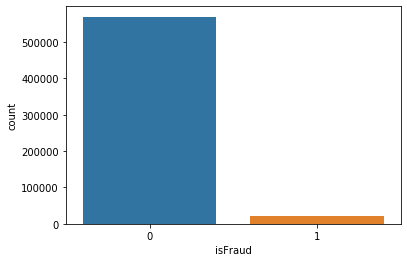

In [ ]:
#checking imbalance data in training dataset
sns.countplot(train_df['isFraud'])
plt.show()

In [ ]:
#calculating % of total imbalance data in training dataset
fraudulent = np.round(train_df[train_df['isFraud']==1].shape[0]/train_df.shape[0]*100,2)
non_fraudulent = np.round(train_df[train_df['isFraud']==0].shape[0]/train_df.shape[0]*100,2)
print('Fradulent data in training datset',fraudulent)
print('Non-fraudulent data in training dataset',non_fraudulent)

Fradulent data in training datset 3.5
Non-fraudulent data in training dataset 96.5


In [ ]:
#function to describe features in dataset
def describe(traindata,testdata,feature):
    df = pd.DataFrame(columns=[feature,'Training','Fraudulent','Non-fraudulent','Test'])
    df[feature] = ['count','mean','std','min','25%','50%','75%','max','unique','NaN','NaNshare']
    for i in range(0,8):
        df['Training'].iloc[i] = traindata[feature].describe().iloc[i]
        df['Fraudulent'].iloc[i]=traindata[traindata['isFraud']==1][feature].describe().iloc[i]
        df['Non-fraudulent'].iloc[i]=traindata[traindata['isFraud']==0][feature].describe().iloc[i]
        df['Test'].iloc[i]=testdata[feature].describe().iloc[i]
    df['Training'].iloc[8] = len(traindata[feature].unique())
    df['Fraudulent'].iloc[8]=len(traindata[traindata['isFraud']==1][feature].unique())
    df['Non-fraudulent'].iloc[8]=len(traindata[traindata['isFraud']==0][feature].unique())
    df['Test'].iloc[8]=len(testdata[feature].unique())
    df['Training'].iloc[9] = traindata[feature].isnull().sum()
    df['Fraudulent'].iloc[9] = traindata[traindata['isFraud']==1][feature].isnull().sum()
    df['Non-fraudulent'].iloc[9] = traindata[traindata['isFraud']==0][feature].isnull().sum()
    df['Test'].iloc[9]=testdata[feature].isnull().sum()
    df['Training'].iloc[10] = traindata[feature].isnull().sum()/len(traindata)
    df['Fraudulent'].iloc[10] = traindata[traindata['isFraud']==1][feature].isnull().sum()/len(traindata[traindata['isFraud']==1])
    df['Non-fraudulent'].iloc[10] = traindata[traindata['isFraud']==0][feature].isnull().sum()/len(traindata[traindata['isFraud']==0])
    df['Test'].iloc[10]=testdata[feature].isnull().sum()/len(testdata)
    return df

In [ ]:
#Analysis of transaction date column given as 'TransactionDT' on training and test dataset
trDT = describe(train_df, test_df,'TransactionDT')
trDT

,TransactionDT,Training,Fraudulent,Non-fraudulent,Test
0,count,590540,20663,569877,506691
1,mean,7.37231e+06,7.69003e+06,7.36079e+06,2.69299e+07
2,std,4.61722e+06,4.41655e+06,4.62393e+06,4.75651e+06
3,min,86400,89760,86400,1.84032e+07
4,25%,3.02706e+06,3.96586e+06,3.01065e+06,2.27715e+07
5,50%,7.30653e+06,7.57523e+06,7.27168e+06,2.72047e+07
6,75%,1.12466e+07,1.12174e+07,1.12533e+07,3.13486e+07
7,max,1.58111e+07,1.58109e+07,1.58111e+07,3.42143e+07
8,unique,573349,20638,553717,494686
9,NaN,0,0,0,0


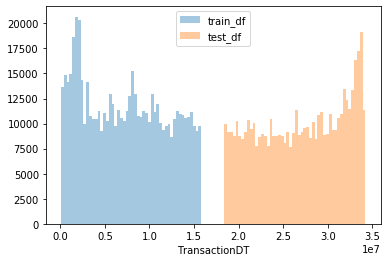

In [ ]:
#plotting histogram to compare 
sns.distplot(train_df['TransactionDT'],kde=False)
sns.distplot(test_df['TransactionDT'],kde=False)
plt.legend(['train_df','test_df'])

In [ ]:
#Timeseries split in hours and day (TransactionDT given in seconds)
#Infered that test data is ahead of training data 
#Initial timing of training data is high and last timimg of test data is high
train_df['day'] = (train_df['TransactionDT']//(3600*24)-1)%7
test_df['day'] = (test_df['TransactionDT']//(3600*24)-1)%7

Text(0.5, 1.0, 'Test')

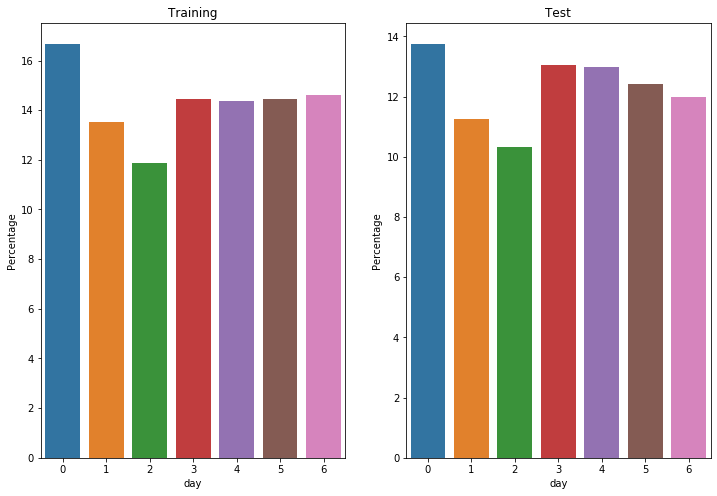

In [ ]:
#Univariate and bivariate analysis
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
percent = lambda i: len(i) / float(len(train_df['day'])) * 100
axis = sns.barplot(x=train_df['day'], y=train_df['day'],  estimator=percent)
axis.set(ylabel="Percentage")
plt.title('Training')
plt.subplot(1,2,2)
percent = lambda i: len(i) / float(len(train_df['day'])) * 100
axis = sns.barplot(x=test_df['day'], y=test_df['day'],  estimator=percent)
axis.set(ylabel="Percentage")
plt.title('Test')

In [ ]:
#From above plot, we can see that Day 0 has more number of transactions than the other days

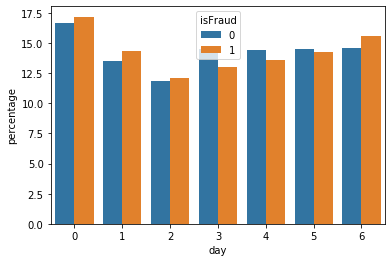

In [ ]:
#Plotting bar graph on the basis of fraudulent transaction and day
tr_day = (train_df.groupby(['isFraud'])['day']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('day'))

sns.barplot(x="day", y="percentage", hue="isFraud", data=tr_day)

In [ ]:
#From above plot, we can see that equal percentage of fraud and non-fraud transactions happened on each day

In [ ]:
#Splitting on the basis of hours
train_df['hour'] = (train_df['TransactionDT']//(3600))%24
test_df['hour'] = (test_df['TransactionDT']//(3600))%24

Text(0.5, 1.0, 'Test')

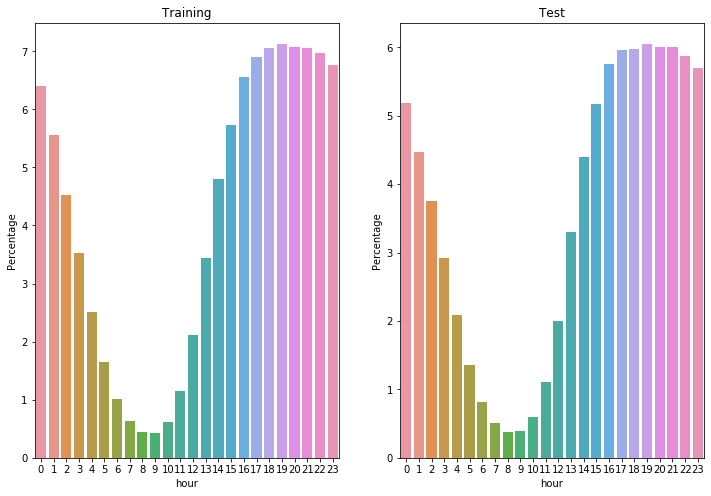

In [ ]:
#plotting bar graph on the basis of hours
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
percent = lambda i: len(i) / float(len(train_df['hour'])) * 100
axis = sns.barplot(x=train_df['hour'], y=train_df['hour'],  estimator=percent)
axis.set(ylabel="Percentage")
plt.title('Training')
plt.subplot(1,2,2)
percent = lambda i: len(i) / float(len(train_df['day'])) * 100
axis = sns.barplot(x=test_df['hour'], y=test_df['hour'],  estimator=percent)
axis.set(ylabel="Percentage")
plt.title('Test')

In [ ]:
#From above plot, it can be seen that transaction decreases from 0-9 hour and increases after 9

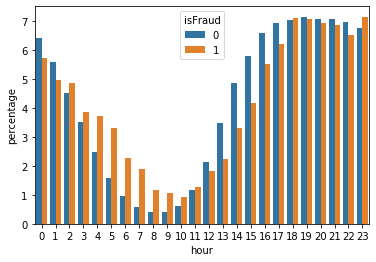

In [ ]:
#Plotting bar graph on the basis of fraudulent transaction and hour
tr_hour = (train_df.groupby(['isFraud'])['hour']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('hour'))
sns.barplot(x="hour", y="percentage", hue="isFraud", data=tr_hour)


In [ ]:
#From above plot, we can see that from 4-9 fraudulent transaction is more and from 13-17 non-fraudulent transactions are more

In [ ]:
#Creating new feature on the basis of above analysis
def hourFeature(hour):
    if hour>3 and hour < 10:
        return "Alert"
    if hour ==10 or hour==17:
        return "Warning"
    if hour==2 or hour==3 or hour==18 or hour==23:
        return "Caution"
    else:
        return "Safe"

In [ ]:
#Creating new attribute
train_df['Check'] = train_df['hour'].apply(hourFeature)
test_df['Check'] = test_df['hour'].apply(hourFeature)

In [ ]:
#Analysing Transaction Amount attribute on taining and test data
trAmt = describe(train_df,test_df,'TransactionAmt')
trAmt

,TransactionAmt,Training,Fraudulent,Non-fraudulent,Test
0,count,590540,20663,569877,506691
1,mean,NaN,inf,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,0.250977,0.291992,0.250977,0.0180054
4,25%,43.3125,35.0312,43.9688,40
5,50%,68.75,75,68.5,67.9375
6,75%,125,161,120,125
7,max,31936,5192,31936,10272
8,unique,8195,2126,8134,7343
9,NaN,0,0,0,0


In [ ]:
#As we can see that the maximum value of transaction amount in training datset is more than the what it is in test dataset.
#It can be outlier, need to analyze it

In [ ]:
#Finding outliers on the basis of percentile
df=[99.90,99.91,99.92,99.93,99.94,99.95,99.96,99.97,99.98,99.99]
for i in df:
    print('Training',np.percentile(train_df['TransactionAmt'],i))
    print('Test',np.percentile(test_df['TransactionAmt'],i))

Training 2768.9220000000205
Test 2982.0
Training 2862.0
Test 3031.957999999984
Training 2908.0
Test 3131.183999999892
Training 2964.0
Test 3190.0
Training 3050.7064000000246
Test 3328.0
Training 3111.4610000001267
Test 3586.6200000001118
Training 3164.0
Test 3809.943999999785
Training 3346.0
Test 4127.972000000067
Training 3777.160400000168
Test 4639.944000000134
Training 4224.0
Test 5192.0


In [ ]:
#There is not much difference in the percentiles, so maybe transaction amount might be corrupt

In [ ]:
#Using another criteria, setting threshold
train_df[train_df['TransactionAmt']>10000]

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,day,hour,Check
274336,3261336,0,6652360,31936.0,W,16075,514.0,150.0,mastercard,102.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,23,Caution
274339,3261339,0,6652391,31936.0,W,16075,514.0,150.0,mastercard,102.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,23,Caution


In [ ]:
#only 2 values are present above 10000 and we can remove it since they are duplicates

In [ ]:
#Working on values which are less than 10000
train_df = train_df[train_df['TransactionAmt']<10000]
#Taking logs and creating new feature because some values are high
train_df['LogTrAmt'] = np.log(train_df['TransactionAmt'])
test_df['LogTrAmt'] = np.log(test_df['TransactionAmt'])

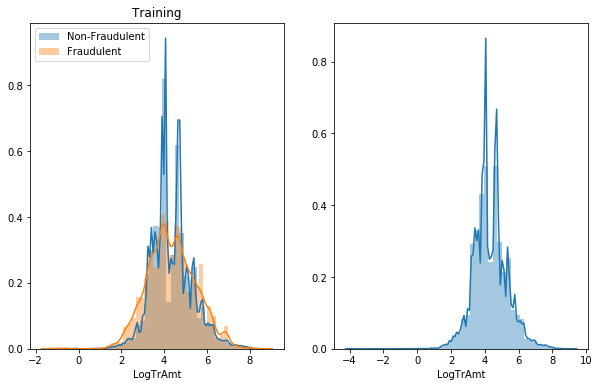

In [ ]:
#Plotting graph on the basis of the log transaction amount
plt.figure(figsize=(10,6))
plt.subplot(1,2,1)
sns.distplot(train_df[train_df['isFraud']==0]['LogTrAmt'])
sns.distplot(train_df[train_df['isFraud']==1]['LogTrAmt'])
plt.legend(['Non-Fraudulent','Fraudulent'])
plt.title('Training')
plt.subplot(1,2,2)
sns.distplot(test_df['LogTrAmt'])

In [ ]:
#As we can see that non-fraudulent transactions are more between 3-5
#fraudulent transaction are more before 3 and after 5

Text(0.5, 1.0, 'Test')

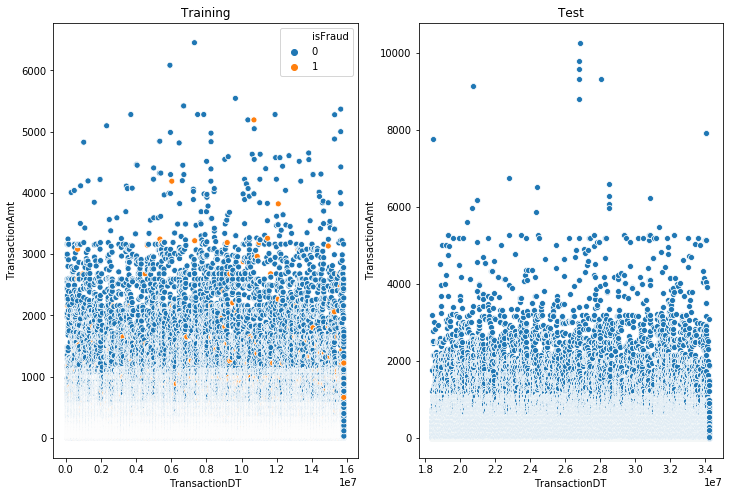

In [ ]:
#Analysing time and transaction on both datasets
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="TransactionAmt",hue="isFraud",data=train_df)
plt.title('Training')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="TransactionAmt",data=test_df)
plt.title('Test')

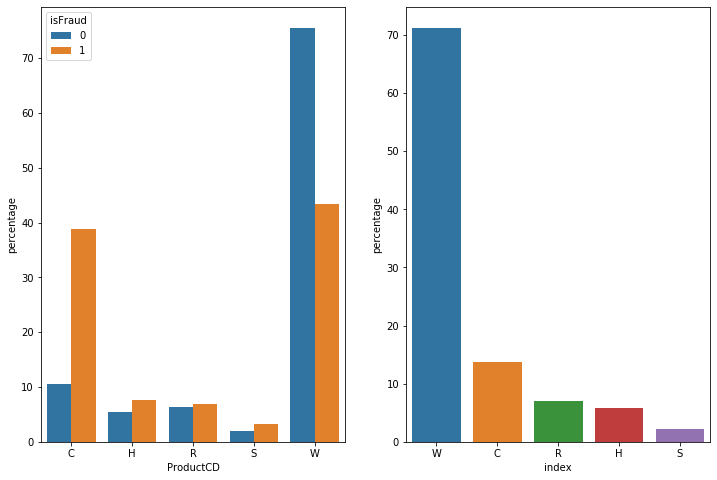

In [ ]:
#Analysing ProductCD on both the datasets
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
train_PrCD = (train_df.groupby(['isFraud'])['ProductCD']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('ProductCD'))
sns.barplot(x="ProductCD", y="percentage", hue="isFraud", data=train_PrCD)
plt.subplot(1,2,2)
test_PrCD =test_df['ProductCD'].value_counts(normalize=True).mul(100).rename('percentage')\
.reset_index()
sns.barplot(x="index", y="percentage", data=test_PrCD)

In [ ]:
#From above plot, with 'C' product code there is high chances of transaction being fraudulent
#with 'W' product code, chances are low
#with 'H,R,S' chances are moderate

In [ ]:
#Analysis on Card 1 attribute of both dataset
cd1 = describe(train_df,test_df,'card1')
cd1

,card1,Training,Fraudulent,Non-fraudulent,Test
0,count,590538,20663,569875,506691
1,mean,9898.71,9547.65,9911.44,9957.22
2,std,4901.17,4762.05,4905.67,4884.96
3,min,1000,1015,1000,1001
4,25%,6019,5732.5,6019,6019
5,50%,9678,9633,9711,9803
6,75%,14182.8,13623,14229,14276
7,max,18396,18375,18396,18397
8,unique,13553,1740,13350,13244
9,NaN,0,0,0,0


Text(0.5, 1.0, 'Test')

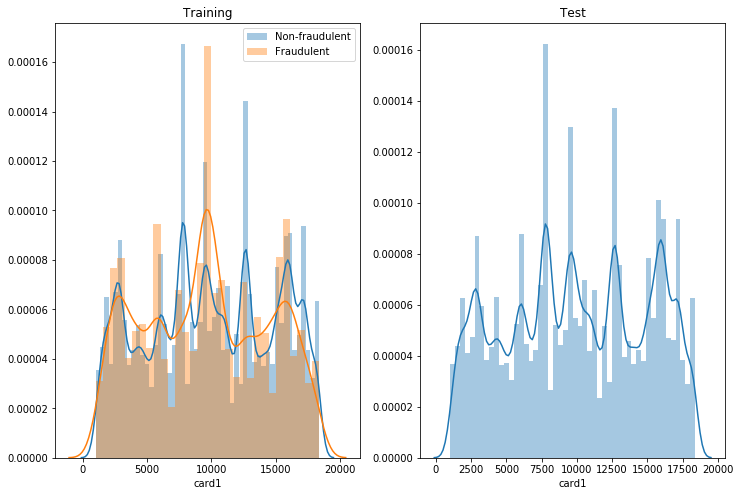

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.distplot(train_df[train_df['isFraud']==0]['card1'])
sns.distplot(train_df[train_df['isFraud']==1]['card1'])
plt.legend(['Non-fraudulent','Fraudulent'])
plt.title('Training')
plt.subplot(1,2,2)
sns.distplot(test_df['card1'])
plt.title('Test')

In [ ]:
#Analysis on Card 2 attribute of both dataset
cd2 = describe(train_df,test_df,'card2')
cd2

,card2,Training,Fraudulent,Non-fraudulent,Test
0,count,581605,20240,561365,498037
1,mean,NaN,inf,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,100,100,100,100
4,25%,214,204,215,207
5,50%,361,375,361,369
6,75%,512,514,512,512
7,max,600,600,600,600
8,unique,501,328,501,498
9,NaN,8933,423,8510,8654


Text(0.5, 1.0, 'Test')

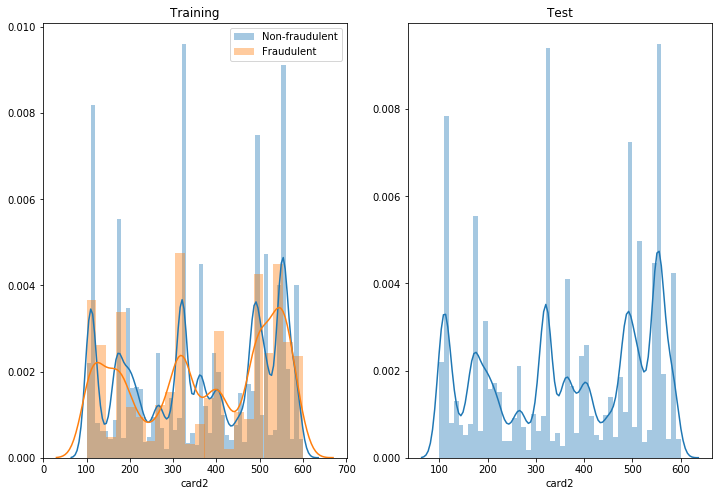

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.distplot(train_df[(train_df['isFraud']==0) & (~train_df['card2'].isnull())]['card2'])
sns.distplot(train_df[(train_df['isFraud']==1) & (~train_df['card2'].isnull())]['card2'])
plt.legend(['Non-fraudulent','Fraudulent'])
plt.title('Training')
plt.subplot(1,2,2)
sns.distplot(test_df[~test_df['card2'].isnull()]['card2'])
plt.title('Test')

In [ ]:
#Analysis on Card 3 attribute of both dataset
cd3 = describe(train_df,test_df,'card3')
cd3

,card3,Training,Fraudulent,Non-fraudulent,Test
0,count,588973,20624,568349,503689
1,mean,NaN,inf,NaN,NaN
2,std,0,17.5,0,0
3,min,100,100,100,100
4,25%,150,150,150,150
5,50%,150,150,150,150
6,75%,150,185,150,150
7,max,231,231,231,232
8,unique,115,63,107,116
9,NaN,1565,39,1526,3002


Text(0.5, 1.0, 'Test')

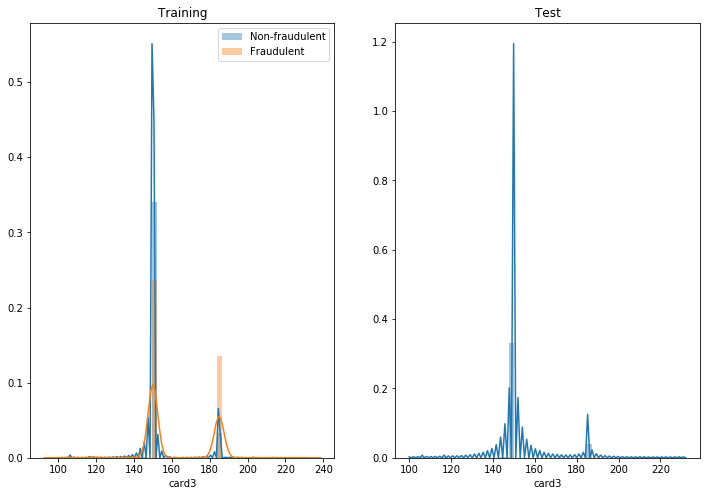

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.distplot(train_df[(train_df['isFraud']==0) & (~train_df['card3'].isnull())]['card3'])
sns.distplot(train_df[(train_df['isFraud']==1) & (~train_df['card3'].isnull())]['card3'])
plt.legend(['Non-fraudulent','Fraudulent'])
plt.title('Training')
plt.subplot(1,2,2)
sns.distplot(test_df[~test_df['card3'].isnull()]['card3'])
plt.title('Test')

In [ ]:
#As we can see only 2 values are present for card 3 in majority
#Greater than 150 so fraudulent transaction increases

In [ ]:
#Creating new features on the basis of above
def determine_cd3(value):
    if value==np.nan:
        return value
    else:
        if value > 150:
            return 'NF'
        else:
            return 'F'

In [ ]:
#Adding attribute
train_df['Card3parameter'] = train_df['card3'].apply(determine_cd3)
test_df['Card3parameter'] = test_df['card3'].apply(determine_cd3)

Text(0.5, 1.0, 'Test')

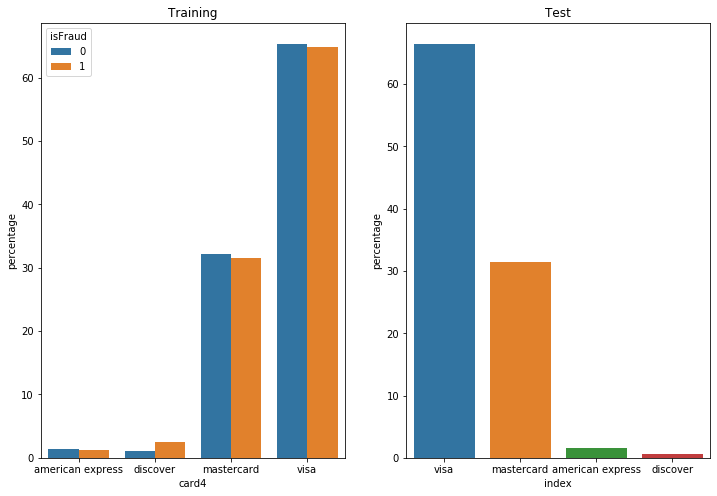

In [ ]:
#Analysis on Card 4 attribute of both dataset
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
train_cd4 = (train_df[~train_df['card4'].isnull()].groupby(['isFraud'])['card4']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('card4'))
sns.barplot(x="card4", y="percentage", hue="isFraud", data=train_cd4)
plt.title('Training')
plt.subplot(1,2,2)
test_cd4 =test_df[~test_df['card4'].isnull()]['card4'].value_counts(normalize=True).mul(100).rename('percentage')\
.reset_index()
sns.barplot(x="index", y="percentage", data=test_cd4)
plt.title('Test')

In [ ]:
#Can be seen with 'discover' card fraudulent transactions are less while with the others it is relatively equal
#Most of transactions are done thorugh visa and mastercard

In [ ]:
#Analysis on Card 5 attribute of both dataset
cd5 = describe(train_df,test_df,'card5')
cd5

,card5,Training,Fraudulent,Non-fraudulent,Test
0,count,586279,20453,565826,502144
1,mean,NaN,inf,NaN,NaN
2,std,0,45.7812,0,0
3,min,100,100,100,100
4,25%,166,138,166,166
5,50%,226,224,226,226
6,75%,226,226,226,226
7,max,237,237,237,237
8,unique,120,50,119,103
9,NaN,4259,210,4049,4547


Text(0.5, 1.0, 'Test')

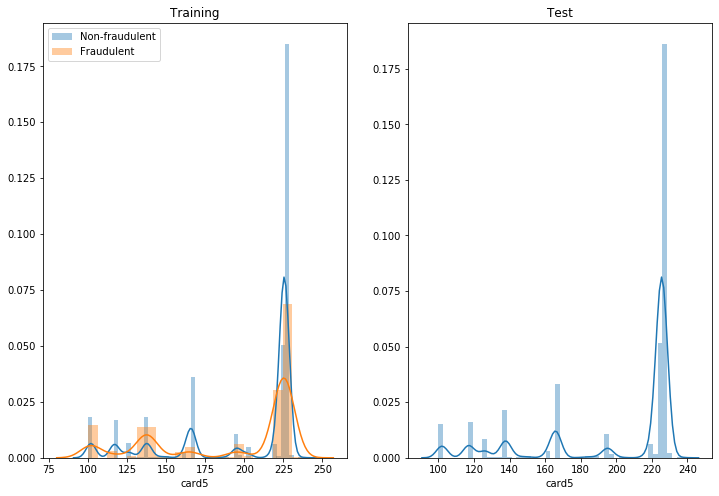

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.distplot(train_df[(train_df['isFraud']==0) & (~train_df['card5'].isnull())]['card5'])
sns.distplot(train_df[(train_df['isFraud']==1) & (~train_df['card5'].isnull())]['card5'])
plt.legend(['Non-fraudulent','Fraudulent'])
plt.title('Training')
plt.subplot(1,2,2)
sns.distplot(test_df[~test_df['card5'].isnull()]['card5'])
plt.title('Test')

Text(0.5, 1.0, 'Test')

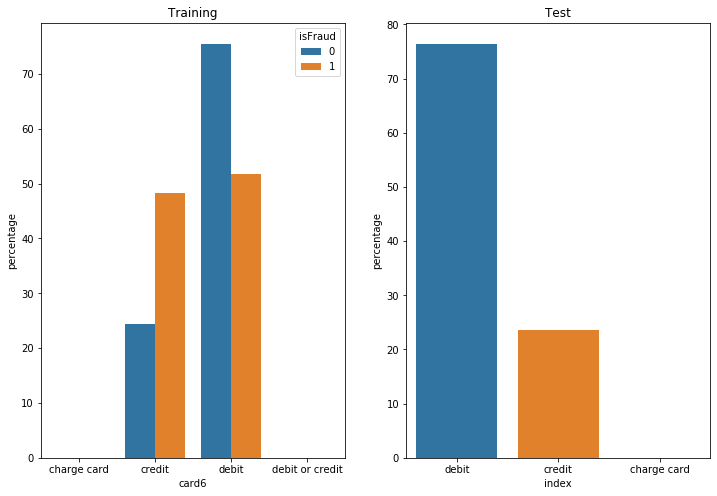

In [ ]:
#Analysis on Card 6 attribute of both dataset
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
train_cd6 = (train_df[~train_df['card6'].isnull()].groupby(['isFraud'])['card6']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('card6'))
sns.barplot(x="card6", y="percentage", hue="isFraud", data=train_cd6)
plt.title('Training')
plt.subplot(1,2,2)
test_cd6 =test_df[~test_df['card6'].isnull()]['card6'].value_counts(normalize=True).mul(100).rename('percentage')\
.reset_index()
sns.barplot(x="index", y="percentage", data=test_cd6)
plt.title('Test')

In [ ]:
#Can be observed credit card holders have more fraud transaction
#no values for debit or credit and charge card

In [ ]:
#Creating new attribute 
def replace(value):
    if value==np.nan:
        return value
    if value=='debit or credit' or value=='charge card':
        return 'Other'
    else:
        return value

In [ ]:
train_df['card6'] = train_df['card6'].apply(replace)
test_df['card6'] = test_df['card6'].apply(replace)

In [ ]:
#Analysis on Addr 1 attribute of both dataset
ad1 = describe(train_df,test_df,'addr1')
ad1

,addr1,Training,Fraudulent,Non-fraudulent,Test
0,count,524832,12922,511910,441082
1,mean,NaN,inf,NaN,NaN
2,std,NaN,103.562,NaN,NaN
3,min,100,110,100,100
4,25%,204,204,204,204
5,50%,299,299,299,299
6,75%,330,330,330,330
7,max,540,536,540,540
8,unique,333,87,333,293
9,NaN,65706,7741,57965,65609


Text(0.5, 1.0, 'Test')

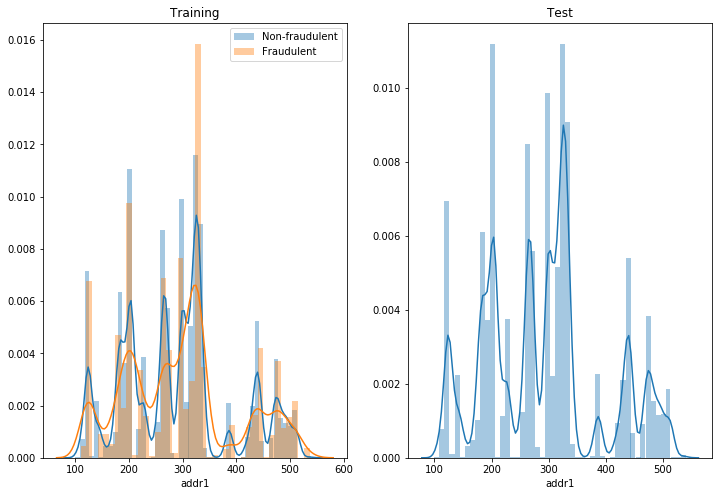

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.distplot(train_df[(train_df['isFraud']==0) & (~train_df['addr1'].isnull())]['addr1'])
sns.distplot(train_df[(train_df['isFraud']==1) & (~train_df['addr1'].isnull())]['addr1'])
plt.legend(['Non-fraudulent','Fraudulent'])
plt.title('Training')
plt.subplot(1,2,2)
sns.distplot(test_df[~test_df['addr1'].isnull()]['addr1'])
plt.title('Test')

In [ ]:
#Analysis on Addr 2 attribute of both dataset
ad2 = describe(train_df,test_df,'addr2')
ad2

,addr2,Training,Fraudulent,Non-fraudulent,Test
0,count,524832,12922,511910,441082
1,mean,NaN,inf,NaN,NaN
2,std,0,4.9375,0,0
3,min,10,10,13,10
4,25%,87,87,87,87
5,50%,87,87,87,87
6,75%,87,87,87,87
7,max,102,96,102,102
8,unique,75,18,69,73
9,NaN,65706,7741,57965,65609


Text(0.5, 1.0, 'Test')

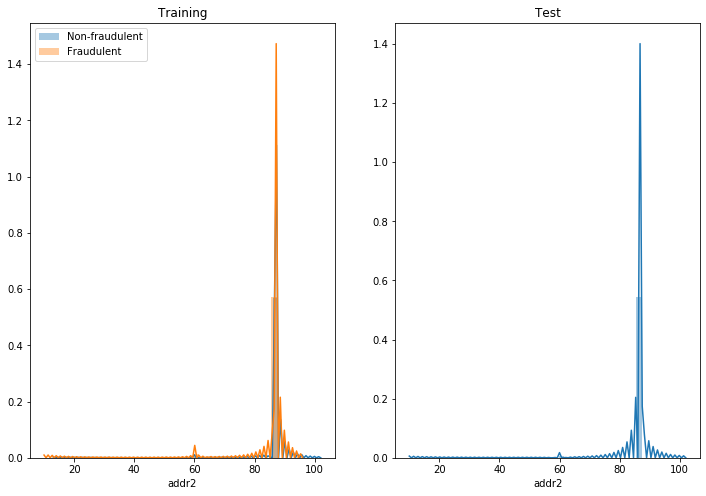

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.distplot(train_df[(train_df['isFraud']==0) & (~train_df['addr2'].isnull())]['addr2'])
sns.distplot(train_df[(train_df['isFraud']==1) & (~train_df['addr2'].isnull())]['addr2'])
plt.legend(['Non-fraudulent','Fraudulent'])
plt.title('Training')
plt.subplot(1,2,2)
sns.distplot(test_df[~test_df['addr2'].isnull()]['addr2'])
plt.title('Test')

In [ ]:
#Address 2 shows billing country and from graph it can be seen it most of the transactions come between 80-100 that means many transactions are from same country

In [ ]:
#Counting values for the billing country in training dataset
train_df['addr2'].value_counts()

87.0     520479
60.0       3084
96.0        638
32.0         91
65.0         82
16.0         55
31.0         47
19.0         33
26.0         25
27.0         20
59.0         17
69.0         17
34.0         16
43.0         12
98.0         11
29.0         11
102.0        11
68.0         10
57.0         10
78.0          8
10.0          8
17.0          7
71.0          7
13.0          7
54.0          6
72.0          6
88.0          5
52.0          5
73.0          5
21.0          5
          ...  
24.0          3
20.0          3
74.0          3
92.0          2
36.0          2
23.0          2
76.0          2
86.0          2
100.0         2
63.0          2
97.0          2
66.0          2
77.0          1
84.0          1
35.0          1
22.0          1
94.0          1
93.0          1
15.0          1
89.0          1
75.0          1
25.0          1
14.0          1
83.0          1
82.0          1
55.0          1
79.0          1
49.0          1
50.0          1
70.0          1
Name: addr2, Length: 74,

In [ ]:
#Country with code 87 have more transactions in training dataset

In [ ]:
#Counting values for the billing country in test dataset
test_df['addr2'].value_counts()

87.0     435934
60.0       4041
96.0        608
32.0         61
65.0         49
31.0         36
69.0         27
19.0         23
16.0         22
73.0         21
57.0         19
43.0         18
98.0         15
27.0         14
34.0         11
102.0        10
54.0         10
41.0          8
79.0          8
45.0          7
36.0          7
26.0          7
100.0         5
40.0          5
61.0          5
101.0         5
38.0          5
28.0          4
48.0          4
24.0          4
          ...  
68.0          3
10.0          3
71.0          3
74.0          2
59.0          2
90.0          2
84.0          2
66.0          2
44.0          2
94.0          2
93.0          2
81.0          2
51.0          1
58.0          1
33.0          1
47.0          1
91.0          1
86.0          1
37.0          1
11.0          1
46.0          1
64.0          1
78.0          1
13.0          1
99.0          1
80.0          1
85.0          1
18.0          1
42.0          1
77.0          1
Name: addr2, Length: 72,

In [ ]:
#Country with code 87 have more transactions in test dataset also

In [ ]:
#Analysis on Dist 1 attribute of both dataset
dst1 = describe(train_df,test_df,'dist1')
dst1

,dist1,Training,Fraudulent,Non-fraudulent,Test
0,count,238267,4755,233512,215474
1,mean,NaN,inf,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,0,0,0,0
4,25%,3,3,3,3
5,50%,8,10,8,8
6,75%,24,85.5,24,20
7,max,10288,4944,10288,8080
8,unique,2413,469,2402,1919
9,NaN,352271,15908,336363,291217


Text(0.5, 1.0, 'Test')

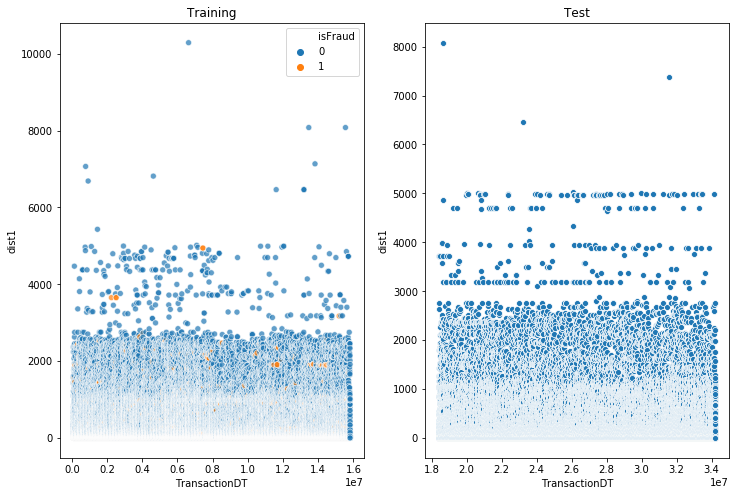

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="dist1",hue="isFraud",data=train_df[~train_df['dist1'].isnull()],alpha=0.7,hue_order=[0,1])
plt.title('Training')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="dist1",data=test_df[~test_df['dist1'].isnull()])
plt.title('Test')

In [ ]:
#Outliers in the dataset above 6000, remove that in training dataset

In [ ]:
#Analysis on Dist 2 attribute of both dataset
dst2 = describe(train_df,test_df,'dist2')
dst2

,dist2,Training,Fraudulent,Non-fraudulent,Test
0,count,37627,3731,33896,36436
1,mean,inf,inf,inf,inf
2,std,inf,inf,inf,inf
3,min,0,0,0,0
4,25%,7,7,7,7
5,50%,37,49,36,44
6,75%,206,233,206,196
7,max,11624,9336,11624,9216
8,unique,1700,345,1674,1756
9,NaN,552911,16932,535979,470255


Text(0.5, 1.0, 'Test')

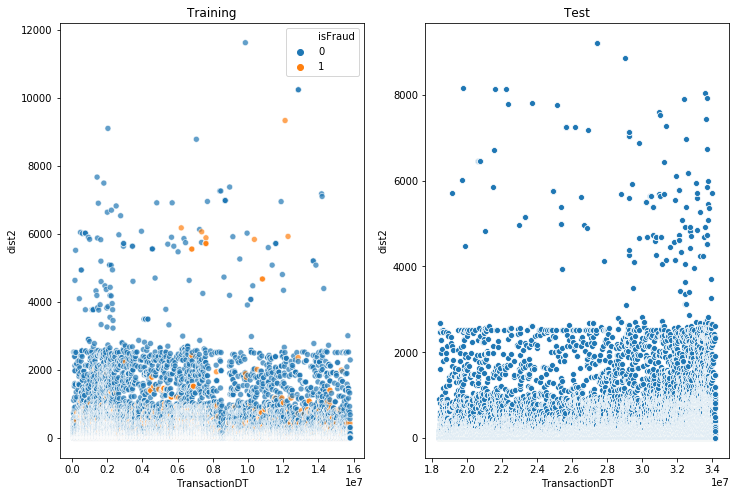

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="dist2",hue="isFraud",data=train_df[~train_df['dist2'].isnull()],alpha=0.7,hue_order=[0,1])
plt.title('Training')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="dist2",data=test_df[~test_df['dist2'].isnull()])
plt.title('Test')

In [ ]:
#Ouliers above 8000, can remove them

In [ ]:
#Analysis on P_emaildomain and R_emaildomain
train_df['P_emaildomain'].value_counts()

gmail.com           228355
yahoo.com           100932
hotmail.com          45250
anonymous.com        36998
aol.com              28289
comcast.net           7888
icloud.com            6267
outlook.com           5096
msn.com               4092
att.net               4033
live.com              3041
sbcglobal.net         2970
verizon.net           2705
ymail.com             2396
bellsouth.net         1909
yahoo.com.mx          1543
me.com                1522
cox.net               1393
optonline.net         1011
charter.net            816
live.com.mx            749
rocketmail.com         664
mail.com               559
earthlink.net          514
gmail                  496
outlook.es             438
mac.com                436
juno.com               322
aim.com                315
windstream.net         305
roadrunner.com         305
hotmail.es             305
hotmail.fr             295
frontier.com           280
embarqmail.com         260
web.de                 240
netzero.com            230
t

In [ ]:
train_df['R_emaildomain'].value_counts()

gmail.com           57147
hotmail.com         27509
anonymous.com       20529
yahoo.com           11842
aol.com              3701
outlook.com          2507
comcast.net          1812
yahoo.com.mx         1508
icloud.com           1398
msn.com               852
live.com              762
live.com.mx           754
verizon.net           620
me.com                556
sbcglobal.net         552
cox.net               459
outlook.es            433
att.net               430
bellsouth.net         422
hotmail.fr            293
hotmail.es            292
web.de                237
mac.com               218
ymail.com             207
prodigy.net.mx        207
optonline.net         187
gmx.de                147
yahoo.fr              137
charter.net           127
mail.com              122
hotmail.co.uk         105
gmail                  95
earthlink.net          79
yahoo.de               75
rocketmail.com         69
embarqmail.com         68
scranton.edu           63
yahoo.es               57
live.fr     

In [ ]:
#Splitting based on domain name and extension 
def email(value):
    return value.split(".")[0]

In [ ]:
#For P_emaildomain
train_df['p_domain'] = train_df[~train_df['P_emaildomain'].isnull()]['P_emaildomain'].apply(email)
test_df['p_domain'] = test_df[~test_df['P_emaildomain'].isnull()]['P_emaildomain'].apply(email)

In [ ]:
train_pdomain = (train_df.groupby(['isFraud'])['p_domain']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('p_domain'))

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43]),
 <a list of 44 Text xticklabel objects>)

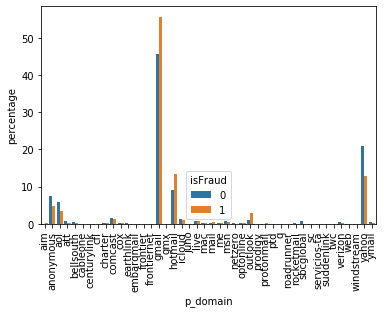

In [ ]:
sns.barplot(x="p_domain", y="percentage", hue="isFraud", data=train_pdomain)
plt.xticks(rotation=90)

In [ ]:
#For R_emaildomain
train_df['r_domain'] = train_df[~train_df['R_emaildomain'].isnull()]['R_emaildomain'].apply(email)
test_df['r_domain'] = test_df[~test_df['R_emaildomain'].isnull()]['R_emaildomain'].apply(email)

In [ ]:
train_rdomain = (train_df.groupby(['isFraud'])['r_domain']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('r_domain'))

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44]),
 <a list of 45 Text xticklabel objects>)

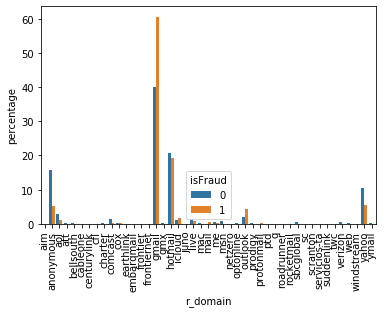

In [ ]:
sns.barplot(x="r_domain", y="percentage", hue="isFraud", data=train_rdomain)
plt.xticks(rotation=90)

In [ ]:
#Creating new features
emails = {'gmail': 'google', 'att.net': 'att', 'twc.com': 'spectrum',
'scranton.edu': 'other', 'optonline.net': 'other', 'hotmail.co.uk': 'microsoft', 'comcast.net': 'other', 'yahoo.com.mx': 'yahoo', 'yahoo.fr'
: 'yahoo', 'yahoo.es': 'yahoo', 'charter.net': 'spectrum', 'live.com':
'microsoft', 'aim.com': 'aol', 'hotmail.de': 'microsoft', 'centurylink.net': 'centurylink', 
'gmail.com': 'google', 'me.com': 'apple', 'earthlink.net': 'other', 'gmx.de': 'other', 
'web.de': 'other', 'cfl.rr.com': 'other', 'hotmail.com': 'microsoft', 'protonmail.com': 'other', 
'hotmail.fr': 'microsoft', 'windstream.net': 'other', 'outlook.es': 'microsoft', 
'yahoo.co.jp': 'yahoo', 'yahoo.de': 'yahoo', 'servicios-ta.com': 'other', 'netzero.net': 'other', 
'suddenlink.net': 'other', 'roadrunner.com': 'other', 'sc.rr.com': 'other', 'live.fr': 'microsoft', 
'verizon.net': 'yahoo', 'msn.com': 'microsoft', 'q.com': 'centurylink',
'prodigy.net.mx': 'att', 'frontier.com': 'yahoo', 'anonymous.com': 'other', 'rocketmail.com': 'yahoo', 
'sbcglobal.net': 'att', 'frontiernet.net': 'yahoo', 'ymail.com': 'yahoo', 'outlook.com': 'microsoft', 
'mail.com': 'other', 'bellsouth.net': 'other', 'embarqmail.com': 'centurylink', 
'cableone.net': 'other', 'hotmail.es': 'microsoft', 'mac.com':
'apple', 'yahoo.co.uk': 'yahoo', 'netzero.com': 'other', 'yahoo.com':
'yahoo', 'live.com.mx': 'microsoft', 'ptd.net': 'other', 'cox.net': 'other', 'aol.com': 'aol', 
'juno.com': 'other', 'icloud.com': 'apple'}
new_emails = ['gmail', 'net', 'edu']
for i in ['P_emaildomain', 'R_emaildomain']:
    train_df[i + '_domain'] = train_df[i].map(emails)
    test_df[i + '_domain'] = test_df[i].map(emails)
    train_df[i + '_ext'] = train_df[i].map(lambda x: str(x).split('.')[-1])
    test_df[i + '_ext'] = test_df[i].map(lambda x: str(x).split('.')[-1])
    train_df[i + '_ext'] = train_df[i + '_ext'].map(lambda x: x if str(x) not in new_emails else 'other')
    test_df[i + '_ext'] = test_df[i + '_ext'].map(lambda x: x if str(x) not in new_emails else 'other')

In [ ]:
test_df.head(5)

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,p_domain,r_domain,P_emaildomain_bin,P_emaildomain_suffix,R_emaildomain_bin,R_emaildomain_suffix,P_emaildomain_domain,P_emaildomain_ext,R_emaildomain_domain,R_emaildomain_ext
0,3663549,18403224,31.953125,W,10409,111.0,150.0,visa,226.0,debit,...,gmail,NaN,google,com,NaN,nan,google,com,NaN,nan
1,3663550,18403263,49.000000,W,4272,111.0,150.0,visa,226.0,debit,...,aol,NaN,aol,com,NaN,nan,aol,com,NaN,nan
2,3663551,18403310,171.000000,W,4476,574.0,150.0,visa,226.0,debit,...,hotmail,NaN,microsoft,com,NaN,nan,microsoft,com,NaN,nan
3,3663552,18403310,285.000000,W,10989,360.0,150.0,visa,166.0,debit,...,gmail,NaN,google,com,NaN,nan,google,com,NaN,nan
4,3663553,18403317,67.937500,W,18018,452.0,150.0,mastercard,117.0,debit,...,gmail,NaN,google,com,NaN,nan,google,com,NaN,nan


In [ ]:
#Dropping 'p_domain' and 'r_domain' because we have new columns
train_df.drop(['p_domain'],axis=1,inplace=True)
train_df.drop(['r_domain'],axis=1,inplace=True)
test_df.drop(['p_domain'],axis=1,inplace=True)
test_df.drop(['r_domain'],axis=1,inplace=True)

In [ ]:
#Analyzing C1 attribute
c1 = describe(train_df,test_df,'C1')
c1

,C1,Training,Fraudulent,Non-fraudulent,Test
0,count,590538,20663,569875,506688
1,mean,NaN,inf,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,0,0,0,0
4,25%,1,1,1,1
5,50%,1,2,1,1
6,75%,3,6,3,3
7,max,4684,4680,4684,2950
8,unique,1495,488,1386,1114
9,NaN,0,0,0,3


In [ ]:
#Outliers present because 75% of values lie between 3 but maximum value is very large

Text(0.5, 1.0, 'Test')

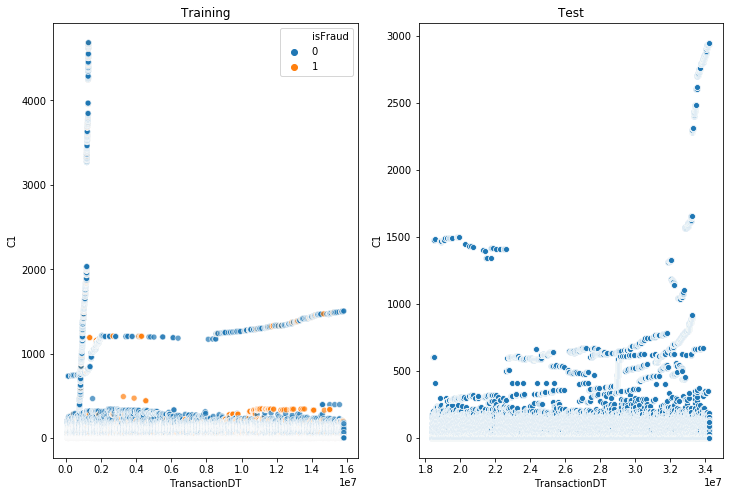

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C1",hue="isFraud",data=train_df,alpha=0.7,hue_order=[0,1])
plt.title('Training')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C1",data=test_df[~test_df['C1'].isnull()])
plt.title('Test')

In [ ]:
#Remove rows which has value above 2000

In [ ]:
train_df = train_df[train_df['C1']<=2000]

In [ ]:
#Analyzing C2 attribute
c2 = describe(train_df,test_df,'C2')
c2

,C2,Training,Fraudulent,Non-fraudulent,Test
0,count,590003,20603,569400,506688
1,mean,NaN,inf,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,0,0,0,0
4,25%,1,1,1,1
5,50%,1,2,1,1
6,75%,3,7,3,3
7,max,2524,2512,2524,3276
8,unique,1064,504,929,1095
9,NaN,0,0,0,3


In [ ]:
#Outliers present because 75% of values lie between 3 but maximum value is very large

Text(0.5, 1.0, 'Test')

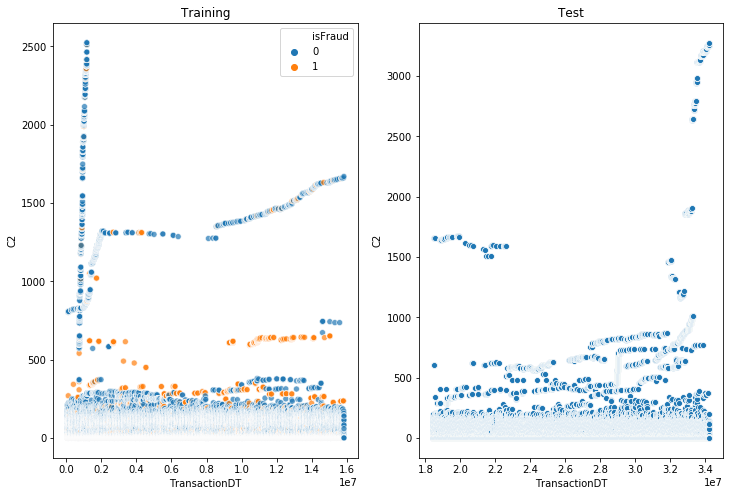

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C2",hue="isFraud",data=train_df,alpha=0.7,hue_order=[0,1])
plt.title('Training')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C2",data=test_df[~test_df['C2'].isnull()])
plt.title('Test')

In [ ]:
#outliers above 2000
train_df = train_df[train_df['C2']<=2000]

In [ ]:
#Analyzing C3 attribute
c3 = describe(train_df,test_df,'C3')
c3

,C3,Training,Fraudulent,Non-fraudulent,Test
0,count,589720,20565,569155,506688
1,mean,0.00566483,0.000243187,0.00585556,0.0273895
2,std,0.150635,0.0155945,0.15332,0.227661
3,min,0,0,0,0
4,25%,0,0,0,0
5,50%,0,0,0,0
6,75%,0,0,0,0
7,max,26,1,26,31
8,unique,27,2,27,32
9,NaN,0,0,0,3


Text(0.5, 1.0, 'Test')

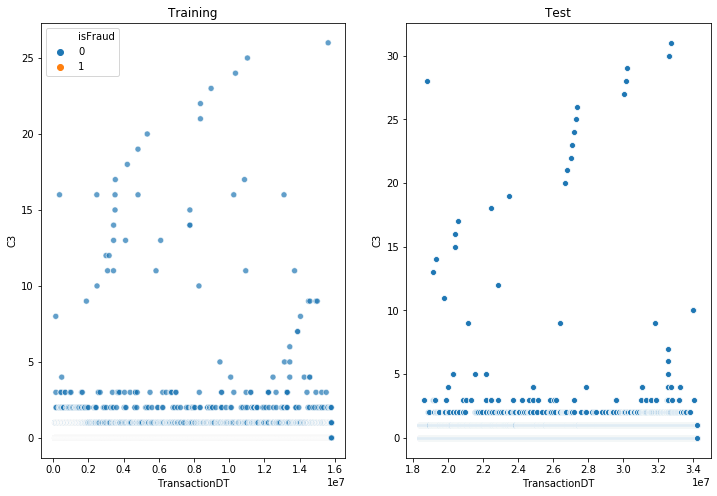

In [ ]:
#75% of training and test data is 0. Fraud data has value 0 and 1
#based on C3, value>1 is non-fraud transaction
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C3",hue="isFraud",data=train_df,alpha=0.7,hue_order=[0,1])
plt.title('Training')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C3",data=test_df[~test_df['C3'].isnull()])
plt.title('Test')

In [ ]:
#Analyzing C4 attribute
c4 = describe(train_df,test_df,'C4')
c4

,C4,Training,Fraudulent,Non-fraudulent,Test
0,count,589720,20565,569155,506688
1,mean,NaN,inf,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,0,0,0,0
4,25%,0,0,0,0
5,50%,0,1,0,0
6,75%,0,2,0,1
7,max,1107,1098,1107,1601
8,unique,751,149,707,729
9,NaN,0,0,0,3


Text(0.5, 1.0, 'Test')

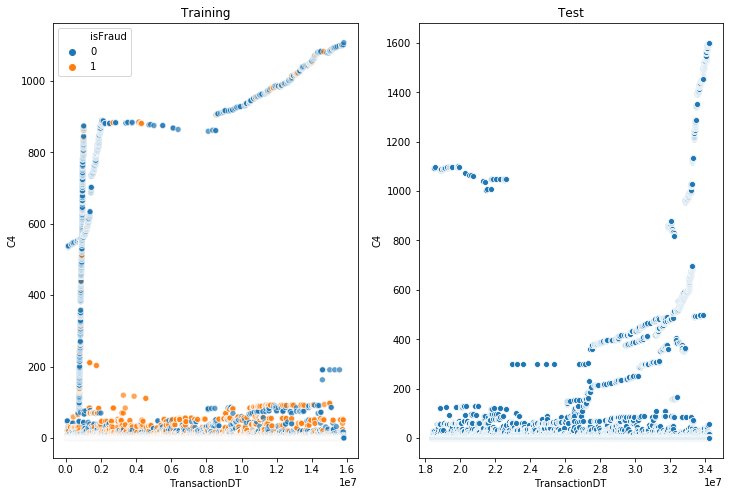

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C4",hue="isFraud",data=train_df,alpha=0.7,hue_order=[0,1])
plt.title('Training')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C4",data=test_df[~test_df['C4'].isnull()])
plt.title('Test')

In [ ]:
#Analyzing C4 attribute
c5 = describe(train_df,test_df,'C5')
c5

,C5,Training,Fraudulent,Non-fraudulent,Test
0,count,589720,20565,569155,506688
1,mean,NaN,1.41406,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,0,0,0,0
4,25%,0,0,0,0
5,50%,0,0,0,0
6,75%,1,0,1,1
7,max,349,331,349,376
8,unique,319,124,319,354
9,NaN,0,0,0,3


Text(0.5, 1.0, 'Test')

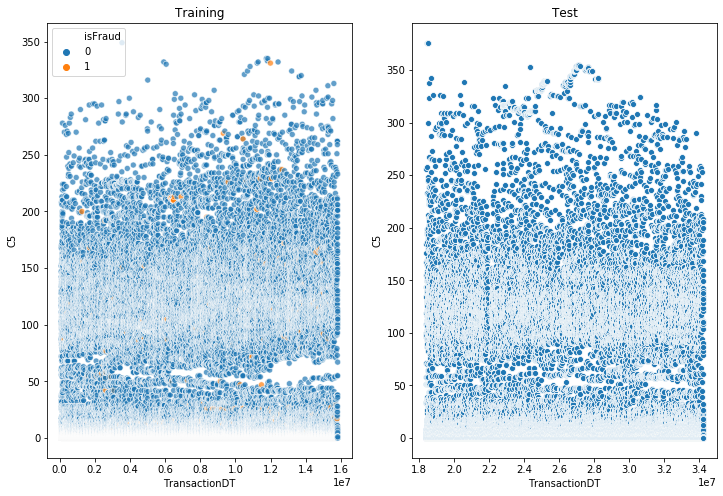

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C5",hue="isFraud",data=train_df,alpha=0.7,hue_order=[0,1])
plt.title('Training')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C5",data=test_df[~test_df['C5'].isnull()])
plt.title('Test')

In [ ]:
#No outliers in C5

In [ ]:
#Analyzing C6 attribute
c6 = describe(train_df,test_df,'C6')
c6

,C6,Training,Fraudulent,Non-fraudulent,Test
0,count,589720,20565,569155,506688
1,mean,NaN,inf,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,0,0,0,0
4,25%,1,1,1,1
5,50%,1,1,1,1
6,75%,2,3,2,2
7,max,1147,1138,1147,1601
8,unique,845,204,813,835
9,NaN,0,0,0,3


Text(0.5, 1.0, 'Test')

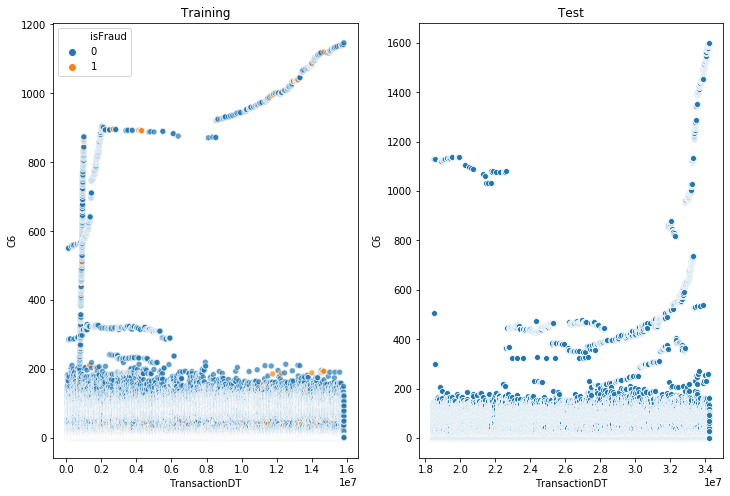

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C6",hue="isFraud",data=train_df,alpha=0.7,hue_order=[0,1])
plt.title('Training')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C6",data=test_df[~test_df['C6'].isnull()])
plt.title('Test')

In [ ]:
#distributuon of C4 and C6 is similar

In [ ]:
#Analyzing C7 attribute
c7 = describe(train_df,test_df,'C7')
c7

,C7,Training,Fraudulent,Non-fraudulent,Test
0,count,589720,20565,569155,506688
1,mean,NaN,inf,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,0,0,0,0
4,25%,0,0,0,0
5,50%,0,0,0,0
6,75%,0,1,0,0
7,max,875,873,875,1621
8,unique,503,117,465,519
9,NaN,0,0,0,3


Text(0.5, 1.0, 'Test')

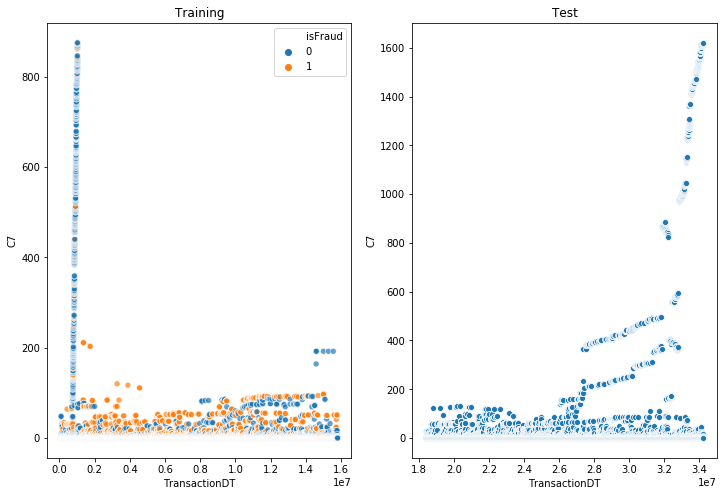

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C7",hue="isFraud",data=train_df,alpha=0.7,hue_order=[0,1])
plt.title('Training')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C7",data=test_df[~test_df['C7'].isnull()])
plt.title('Test')

In [ ]:
#Analyzing C8 attribute
c8 = describe(train_df,test_df,'C8')
c8

,C8,Training,Fraudulent,Non-fraudulent,Test
0,count,589720,20565,569155,506688
1,mean,NaN,inf,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,0,0,0,0
4,25%,0,0,0,0
5,50%,0,1,0,0
6,75%,0,2,0,1
7,max,1306,1304,1306,1005
8,unique,678,235,583,443
9,NaN,0,0,0,3


Text(0.5, 1.0, 'Test')

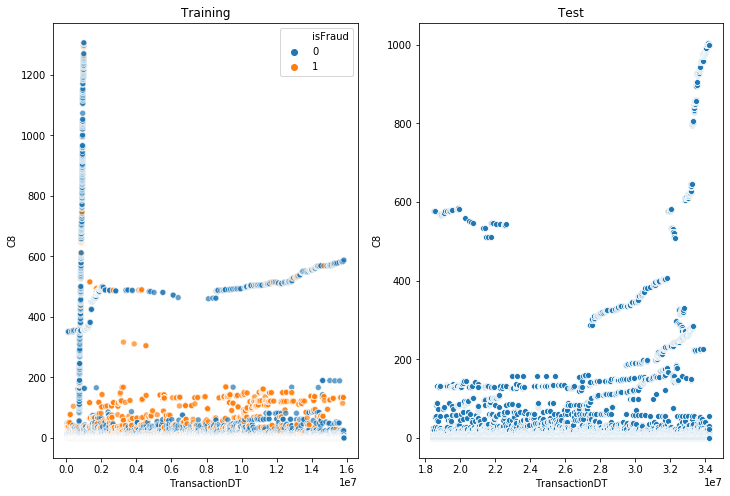

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C8",hue="isFraud",data=train_df,alpha=0.7,hue_order=[0,1])
plt.title('Training')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C8",data=test_df[~test_df['C8'].isnull()])
plt.title('Test')

In [ ]:
#Analyzing C9 attribute
c9 = describe(train_df,test_df,'C9')
c9

,C9,Training,Fraudulent,Non-fraudulent,Test
0,count,589720,20565,569155,506688
1,mean,NaN,1.71191,NaN,NaN
2,std,0,8.47656,0,NaN
3,min,0,0,0,0
4,25%,0,0,0,0
5,50%,1,0,1,1
6,75%,2,1,2,2
7,max,210,192,210,572
8,unique,205,111,205,355
9,NaN,0,0,0,3


Text(0.5, 1.0, 'Test')

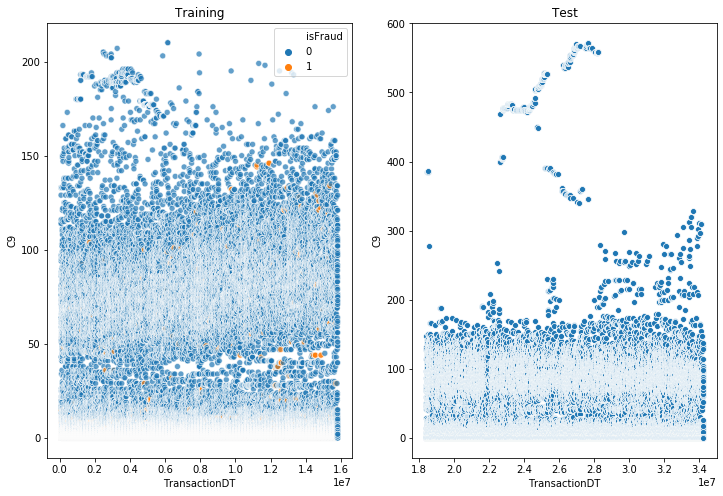

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C9",hue="isFraud",data=train_df,alpha=0.7,hue_order=[0,1])
plt.title('Training')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C9",data=test_df[~test_df['C9'].isnull()])
plt.title('Test')

In [ ]:
#Analyzing C10 attribute
c10 = describe(train_df,test_df,'C10')
c10

,C10,Training,Fraudulent,Non-fraudulent,Test
0,count,589720,20565,569155,506688
1,mean,NaN,inf,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,0,0,0,0
4,25%,0,0,0,0
5,50%,0,1,0,0
6,75%,0,2,0,1
7,max,1464,1462,1464,881
8,unique,703,160,669,457
9,NaN,0,0,0,3


Text(0.5, 1.0, 'Test')

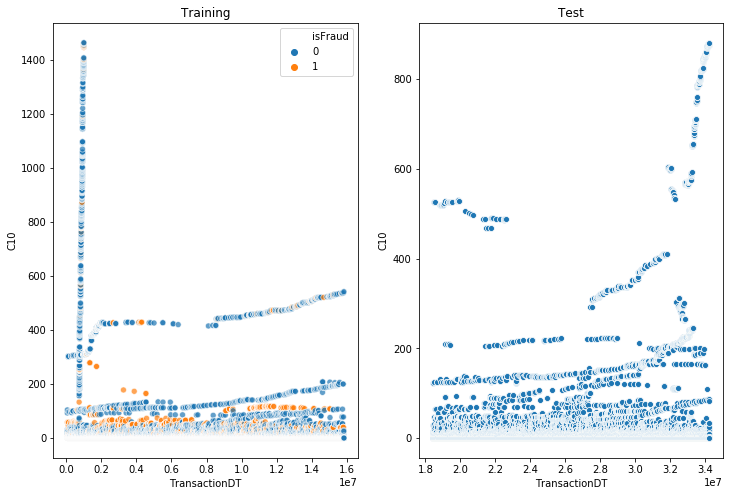

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C10",hue="isFraud",data=train_df,alpha=0.7,hue_order=[0,1])
plt.title('Training')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C10",data=test_df[~test_df['C10'].isnull()])
plt.title('Test')

In [ ]:
#Analyzing C11 attribute
c11 = describe(train_df,test_df,'C11')
c11

,C11,Training,Fraudulent,Non-fraudulent,Test
0,count,589720,20565,569155,506688
1,mean,NaN,inf,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,0,0,0,0
4,25%,1,1,1,1
5,50%,1,2,1,1
6,75%,2,4,2,2
7,max,1210,1203,1210,2234
8,unique,879,250,851,911
9,NaN,0,0,0,3


Text(0.5, 1.0, 'Test')

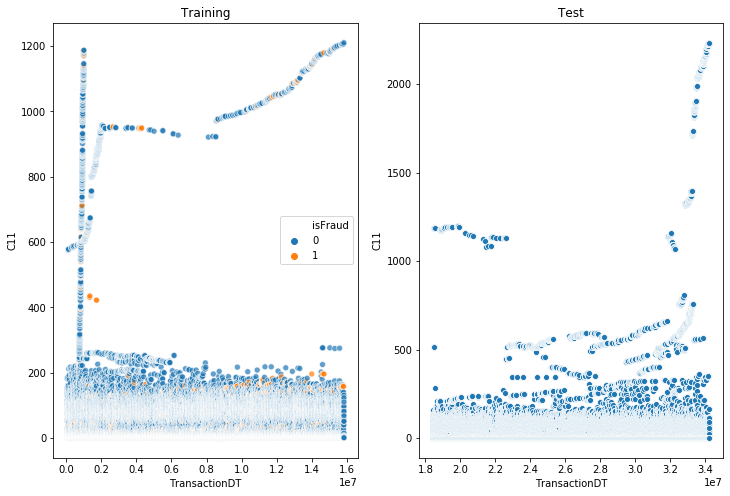

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C11",hue="isFraud",data=train_df,alpha=0.7,hue_order=[0,1])
plt.title('Training')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C11",data=test_df[~test_df['C11'].isnull()])
plt.title('Test')

In [ ]:
#Analyzing C12 attribute
c12 = describe(train_df,test_df,'C12')
c12

,C12,Training,Fraudulent,Non-fraudulent,Test
0,count,589720,20565,569155,506688
1,mean,NaN,inf,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,0,0,0,0
4,25%,0,0,0,0
5,50%,0,0,0,0
6,75%,0,2,0,1
7,max,1187,1185,1187,2234
8,unique,593,202,496,637
9,NaN,0,0,0,3


Text(0.5, 1.0, 'Test')

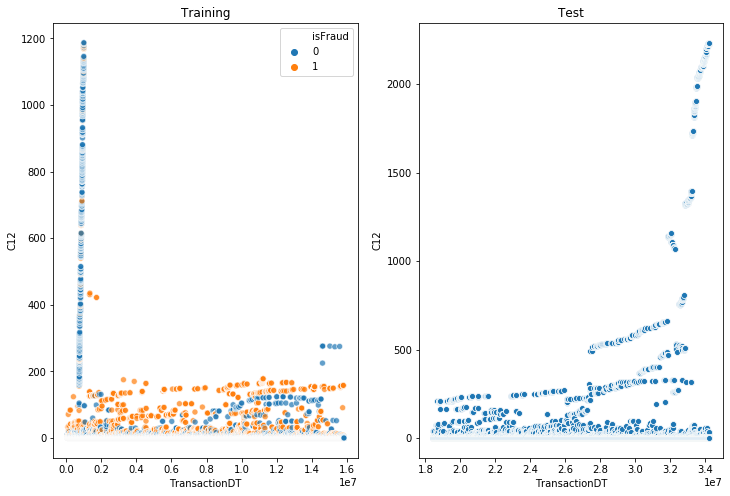

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C12",hue="isFraud",data=train_df,alpha=0.7,hue_order=[0,1])
plt.title('Training')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C12",data=test_df[~test_df['C12'].isnull()])
plt.title('Test')

In [ ]:
#Analyzing C13 attribute
c13 = describe(train_df,test_df,'C13')
c13

,C13,Training,Fraudulent,Non-fraudulent,Test
0,count,589720,20565,569155,501943
1,mean,NaN,inf,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,0,0,0,0
4,25%,1,1,1,1
5,50%,3,1,3,3
6,75%,12,5,13,13
7,max,1285,1283,1285,1562
8,unique,1035,316,1032,1070
9,NaN,0,0,0,4748


Text(0.5, 1.0, 'Test')

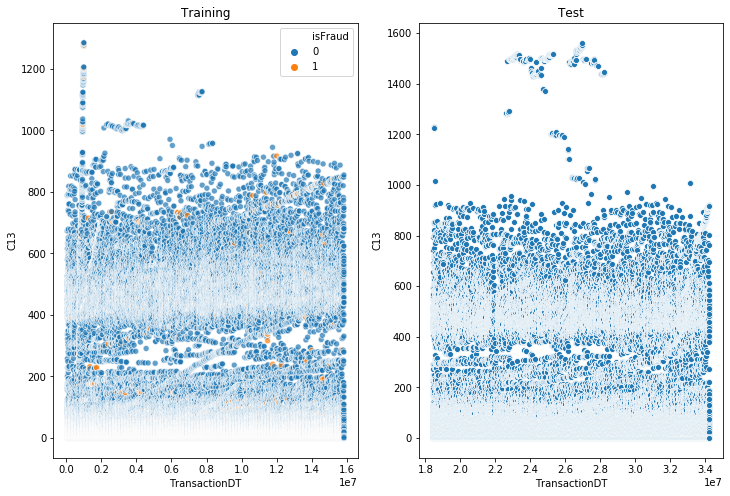

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C13",hue="isFraud",data=train_df,alpha=0.7,hue_order=[0,1])
plt.title('Training')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C13",data=test_df[~test_df['C13'].isnull()])
plt.title('Test')

In [ ]:
#Analyzing C14 attribute
c14 = describe(train_df,test_df,'C14')
c14

,C14,Training,Fraudulent,Non-fraudulent,Test
0,count,589720,20565,569155,506688
1,mean,NaN,inf,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,0,0,0,0
4,25%,1,0,1,1
5,50%,1,1,1,1
6,75%,2,2,2,2
7,max,798,792,798,797
8,unique,739,171,733,570
9,NaN,0,0,0,3


Text(0.5, 1.0, 'Test')

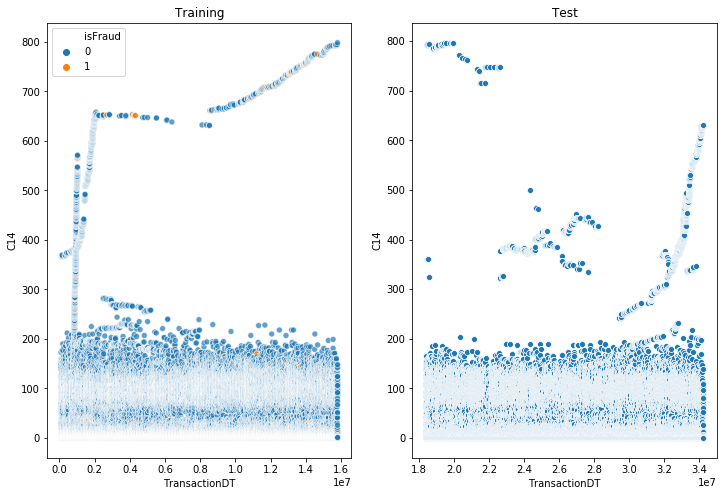

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C14",hue="isFraud",data=train_df,alpha=0.7,hue_order=[0,1])
plt.title('Training')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C14",data=test_df[~test_df['C14'].isnull()])
plt.title('Test')

In [ ]:
#Most of C vales have same distribution

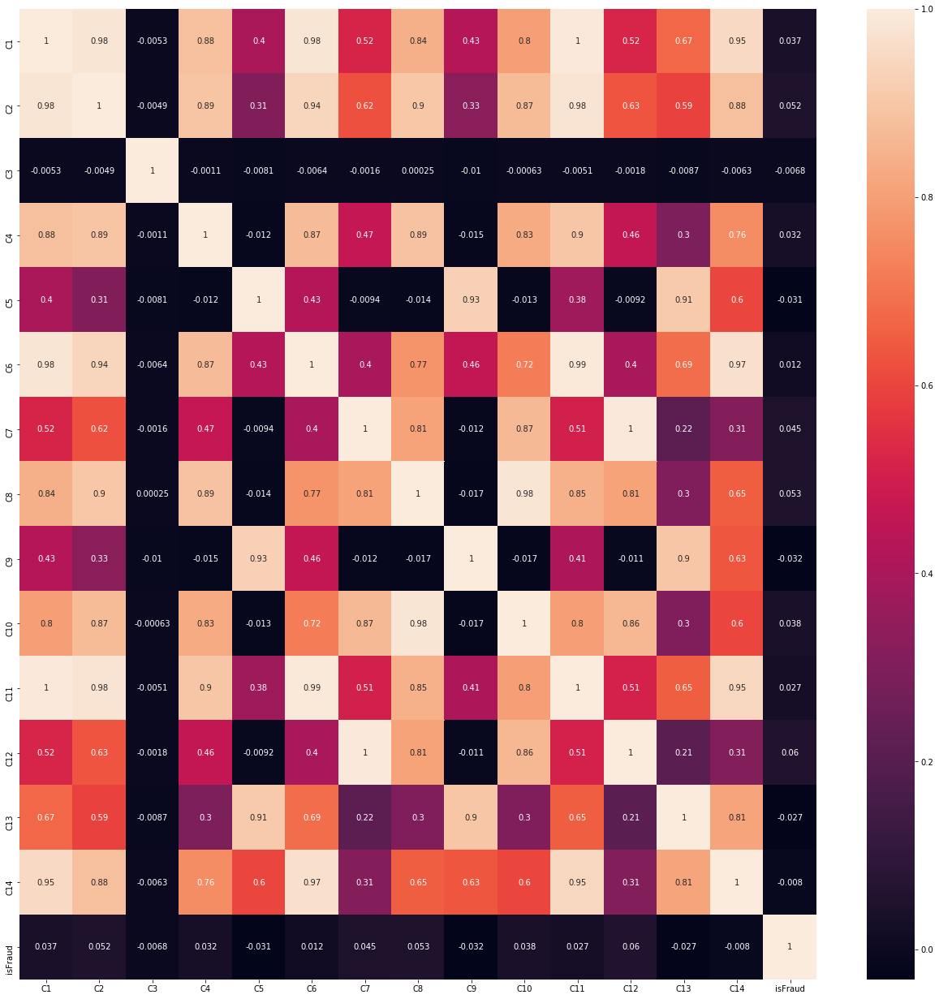

In [ ]:
#Finding correlation between C values in training dataset
cor_df = train_df[['C1','C2','C3','C4','C5','C6','C7','C8','C9','C10','C11','C12','C13','C14','isFraud']]
value = cor_df.corr()
plt.figure(1,figsize=(22,22))
sns.heatmap(value,annot=True)

In [ ]:
#C1 and C2 correlated
#C1 and C6
#C1 and C14
#C6 and C14

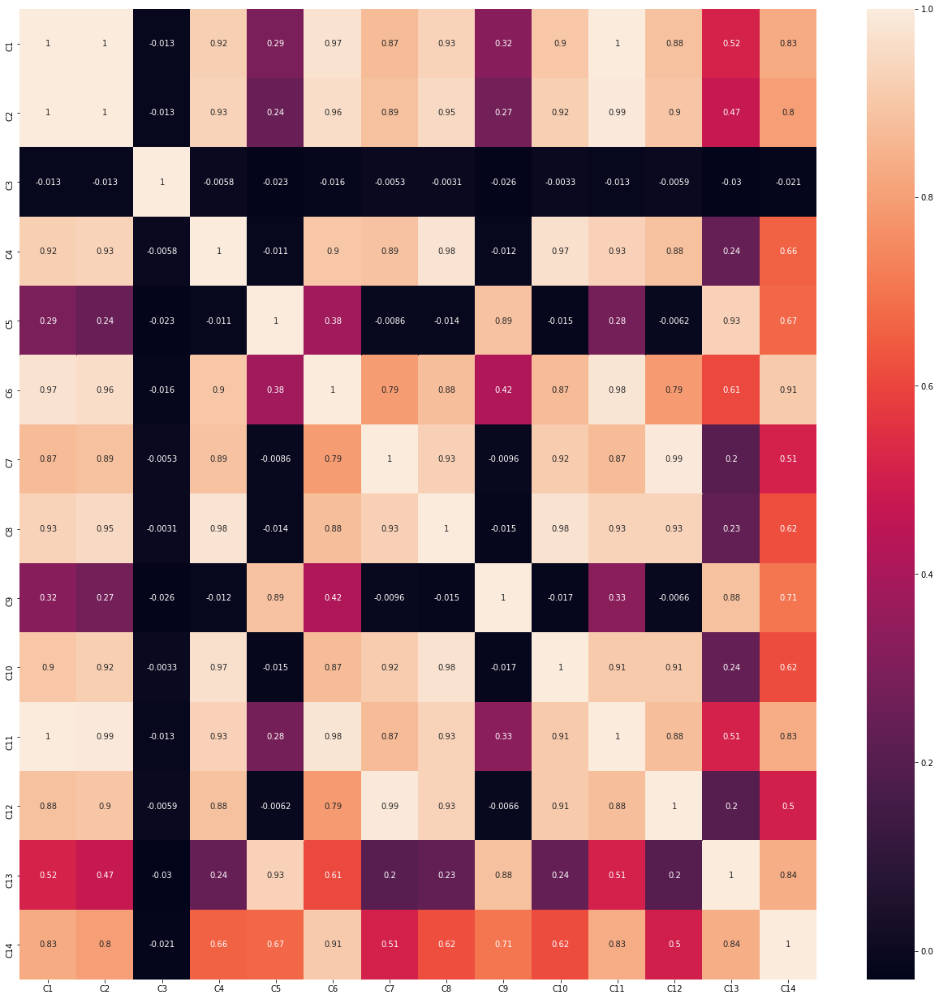

In [ ]:
#Finding correlation between C values in test dataset
cor_df_test = test_df[['C1','C2','C3','C4','C5','C6','C7','C8','C9','C10','C11','C12','C13','C14']]
value = cor_df_test.corr()
plt.figure(1,figsize=(22,22))
sns.heatmap(value,annot=True)

In [ ]:
#Analyzing D1 attribute
d1 = describe(train_df,test_df,'D1')
d1

,D1,Training,Fraudulent,Non-fraudulent,Test
0,count,588451,20519,567932,500660
1,mean,NaN,inf,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,0,0,0,0
4,25%,0,0,0,0
5,50%,3,0,4,5
6,75%,122,14,126,148
7,max,640,637,640,641
8,unique,642,578,642,643
9,NaN,1269,46,1223,6031


Text(0.5, 1.0, 'Test')

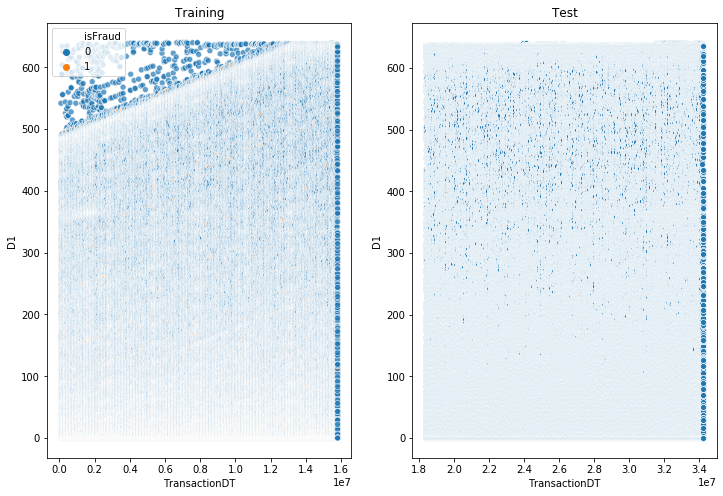

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="D1",hue="isFraud",data=train_df,alpha=0.7,hue_order=[0,1])
plt.title('Training')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="D1",data=test_df[~test_df['D1'].isnull()])
plt.title('Test')

In [ ]:
#Analyzing D2 attribute
d2 = describe(train_df,test_df,'D2')
d2

,D2,Training,Fraudulent,Non-fraudulent,Test
0,count,309505,7855,301650,271922
1,mean,NaN,inf,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,0,0,0,0
4,25%,26,2,27,26
5,50%,97,16,100,112
6,75%,276,95,281,305
7,max,640,637,640,641
8,unique,642,542,642,643
9,NaN,280215,12710,267505,234769


Text(0.5, 1.0, 'Test')

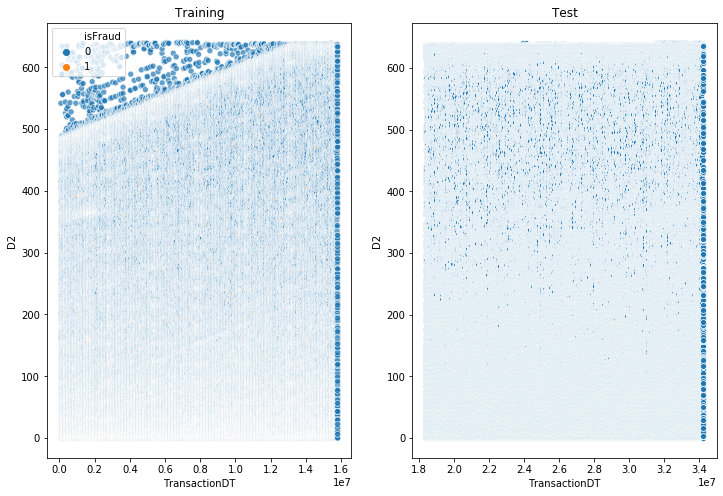

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="D2",hue="isFraud",data=train_df,alpha=0.7,hue_order=[0,1])
plt.title('Training')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="D2",data=test_df[~test_df['D2'].isnull()])
plt.title('Test')

In [ ]:
#Analyzing D3 attribute
d3 = describe(train_df,test_df,'D3')
d3

,D3,Training,Fraudulent,Non-fraudulent,Test
0,count,327331,9572,317759,303549
1,mean,NaN,inf,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,0,0,0,0
4,25%,1,0,1,1
5,50%,8,1,8,7
6,75%,27,5,28,28
7,max,819,582,819,1076
8,unique,650,261,650,888
9,NaN,262389,10993,251396,203142


Text(0.5, 1.0, 'Test')

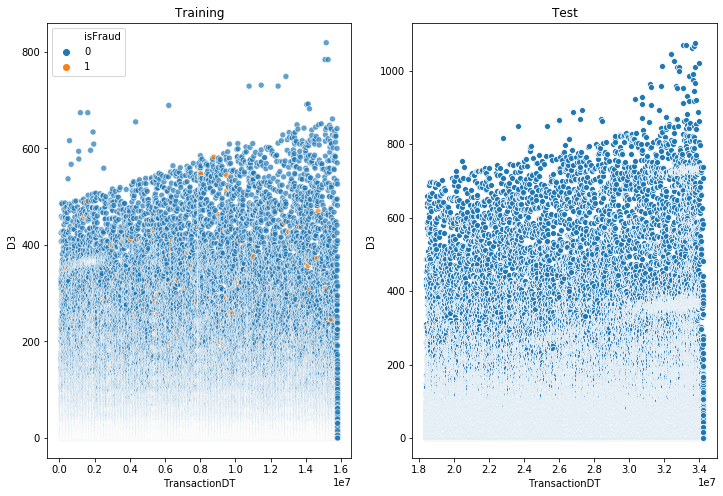

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="D3",hue="isFraud",data=train_df,alpha=0.7,hue_order=[0,1])
plt.title('Training')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="D3",data=test_df[~test_df['D3'].isnull()])
plt.title('Test')

In [ ]:
#Analyzing D3 attribute
d4 = describe(train_df,test_df,'D4')
d4

,D4,Training,Fraudulent,Non-fraudulent,Test
0,count,420809,14473,406336,429840
1,mean,NaN,inf,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,-122,0,-122,0
4,25%,0,0,0,0
5,50%,26,1,28,21
6,75%,254,60,261,290
7,max,869,667,869,1091
8,unique,809,606,809,1057
9,NaN,168911,6092,162819,76851


Text(0.5, 1.0, 'Test')

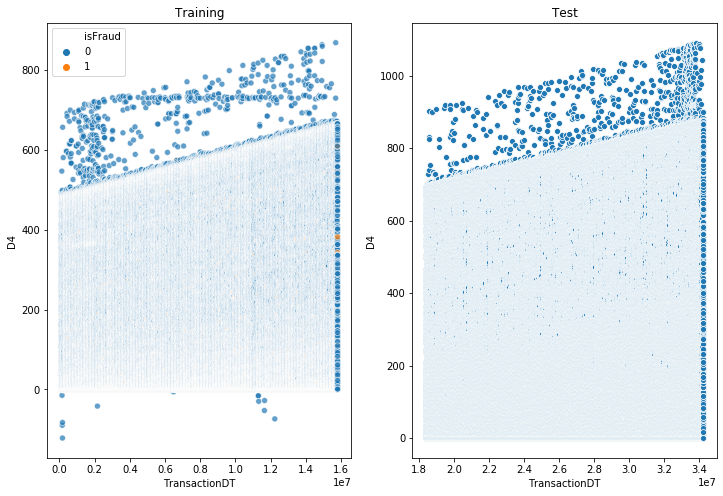

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="D4",hue="isFraud",data=train_df,alpha=0.7,hue_order=[0,1])
plt.title('Training')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="D4",data=test_df[~test_df['D4'].isnull()])
plt.title('Test')

In [ ]:
#dropping negative values
train_df[train_df['D4']<0].index

Int64Index([  2947,   4210,   5264,   5501,   6057,   9120, 110695, 268153,
            444548, 444552, 445576, 446484, 455658, 456223, 473396],
           dtype='int64')

In [ ]:
train_df.drop([2947,   4210,   5264,   5501,   6057,   9120, 110695, 268153,
            444548, 444552, 445576, 446484, 455658, 456223, 473396],inplace=True)

In [ ]:
#Analyzing D5 attribute
d5 = describe(train_df,test_df,'D5')
d5

,D5,Training,Fraudulent,Non-fraudulent,Test
0,count,280288,10809,269479,282316
1,mean,NaN,inf,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,0,0,0,0
4,25%,1,0,1,0
5,50%,10,0,10,8
6,75%,32,3,34,34
7,max,819,625,819,1088
8,unique,689,340,689,962
9,NaN,309417,9756,299661,224375


Text(0.5, 1.0, 'Test')

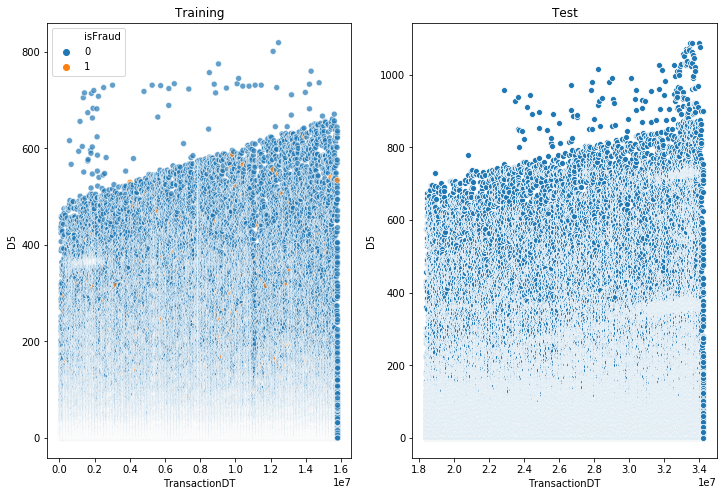

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="D5",hue="isFraud",data=train_df,alpha=0.7,hue_order=[0,1])
plt.title('Training')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="D5",data=test_df[~test_df['D5'].isnull()])
plt.title('Test')

In [ ]:
#Analyzing D6 attribute
d6 = describe(train_df,test_df,'D6')
d6

,D6,Training,Fraudulent,Non-fraudulent,Test
0,count,72377,7624,64753,124783
1,mean,NaN,inf,inf,NaN
2,std,NaN,inf,inf,NaN
3,min,0,0,0,0
4,25%,0,0,0,0
5,50%,0,0,0,0
6,75%,40,23,44,13
7,max,873,694,873,1091
8,unique,827,378,827,1073
9,NaN,517328,12941,504387,381908


Text(0.5, 1.0, 'Test')

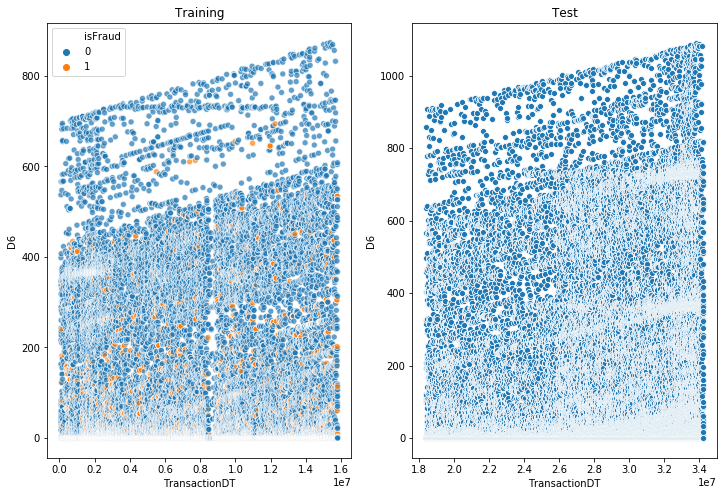

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="D6",hue="isFraud",data=train_df,alpha=0.7,hue_order=[0,1])
plt.title('Training')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="D6",data=test_df[~test_df['D6'].isnull()])
plt.title('Test')

In [ ]:
#Analyzing D7 attribute
d7 = describe(train_df,test_df,'D7')
d7

,D7,Training,Fraudulent,Non-fraudulent,Test
0,count,38510,5719,32791,60133
1,mean,inf,11.25,inf,inf
2,std,inf,inf,inf,inf
3,min,0,0,0,0
4,25%,0,0,0,0
5,50%,0,0,0,0
6,75%,17,0,24,18
7,max,843,547,843,1088
8,unique,598,239,598,905
9,NaN,551195,14846,536349,446558


Text(0.5, 1.0, 'Test')

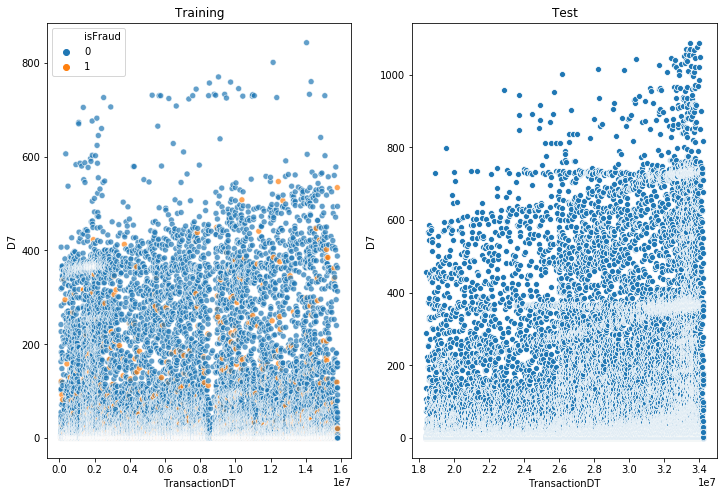

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="D7",hue="isFraud",data=train_df,alpha=0.7,hue_order=[0,1])
plt.title('Training')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="D7",data=test_df[~test_df['D7'].isnull()])
plt.title('Test')

In [ ]:
#Analyzing D8 attribute
d8 = describe(train_df,test_df,'D8')
d8

,D8,Training,Fraudulent,Non-fraudulent,Test
0,count,74576,7763,66813,74338
1,mean,NaN,inf,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,0,0,0,0
4,25%,0.958496,0.75,1.79199,1.08301
5,50%,38.0312,2.66602,50.6562,37.7188
6,75%,188.125,32.375,207.875,221.125
7,max,1708,1291,1708,2030
8,unique,5365,1276,5321,5523
9,NaN,515129,12802,502327,432353


Text(0.5, 1.0, 'Test')

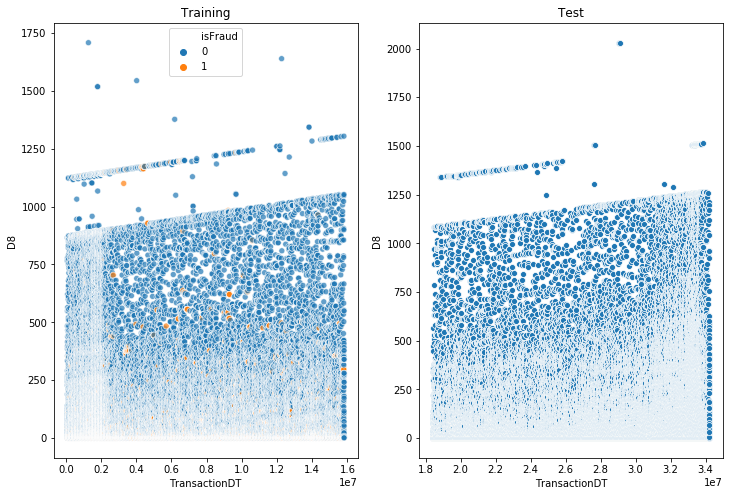

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="D8",hue="isFraud",data=train_df,alpha=0.7,hue_order=[0,1])
plt.title('Training')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="D8",data=test_df[~test_df['D8'].isnull()])
plt.title('Test')

In [ ]:
#Analyzing D9 attribute
d9 = describe(train_df,test_df,'D9')
d9

,D9,Training,Fraudulent,Non-fraudulent,Test
0,count,74576,7763,66813,74338
1,mean,0.561523,0.519043,0.56543,0.554199
2,std,0.31665,0.333252,0.314453,0.317383
3,min,0,0,0,0
4,25%,0.208374,0.166626,0.208374,0.208374
5,50%,0.666504,0.625,0.666504,0.666504
6,75%,0.833496,0.833496,0.833496,0.791504
7,max,0.958496,0.958496,0.958496,0.958496
8,unique,25,25,25,25
9,NaN,515129,12802,502327,432353


Text(0.5, 1.0, 'Test')

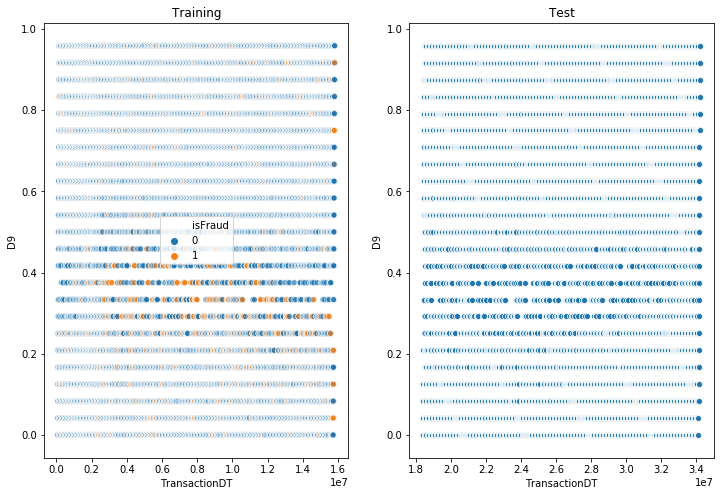

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="D9",hue="isFraud",data=train_df,alpha=0.7,hue_order=[0,1])
plt.title('Training')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="D9",data=test_df[~test_df['D9'].isnull()])
plt.title('Test')

In [ ]:
#Analyzing D10 attribute
d10 = describe(train_df,test_df,'D10')
d10

,D10,Training,Fraudulent,Non-fraudulent,Test
0,count,514475,16769,497706,494146
1,mean,NaN,inf,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,0,0,0,0
4,25%,0,0,0,0
5,50%,15,0,18,10
6,75%,197,14,205,250
7,max,876,664,876,1091
8,unique,819,614,819,1076
9,NaN,75230,3796,71434,12545


Text(0.5, 1.0, 'Test')

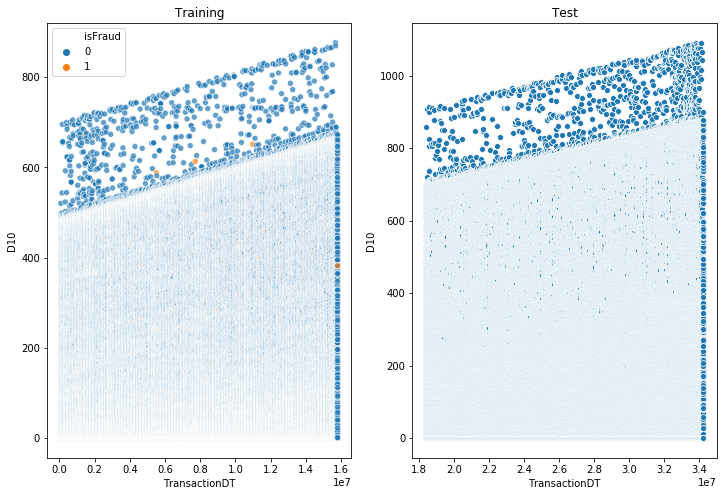

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="D10",hue="isFraud",data=train_df,alpha=0.7,hue_order=[0,1])
plt.title('Training')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="D10",data=test_df[~test_df['D10'].isnull()])
plt.title('Test')

In [ ]:
#Analyzing D11 attribute
d11 = describe(train_df,test_df,'D11')
d11

,D11,Training,Fraudulent,Non-fraudulent,Test
0,count,311247,6106,305141,330173
1,mean,NaN,inf,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,-53,0,-53,0
4,25%,0,0,0,0
5,50%,43,7,44,102
6,75%,274,107.75,277,401
7,max,670,655,670,883
8,unique,675,557,675,881
9,NaN,278458,14459,263999,176518


Text(0.5, 1.0, 'Test')

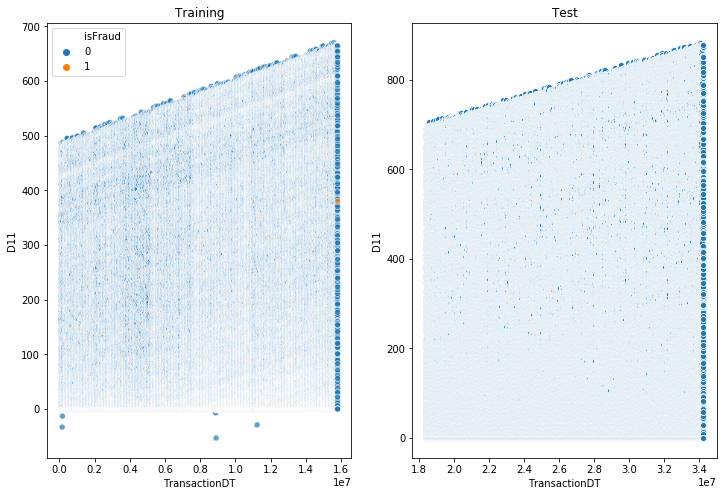

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="D11",hue="isFraud",data=train_df,alpha=0.7,hue_order=[0,1])
plt.title('Training')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="D11",data=test_df[~test_df['D11'].isnull()])
plt.title('Test')

In [ ]:
#-ve values to br deleted
train_df[train_df['D11']<0].index

Int64Index([3814, 4932, 358337, 359698, 442488], dtype='int64')

In [ ]:
train_df.drop([3814, 4932, 358337, 359698, 442488],inplace=True)

In [ ]:
#Analyzing D11 attribute
d12 = describe(train_df,test_df,'D12')
d12

,D12,Training,Fraudulent,Non-fraudulent,Test
0,count,63898,7500,56398,69254
1,mean,inf,inf,inf,NaN
2,std,inf,inf,inf,NaN
3,min,0,0,0,0
4,25%,0,0,0,0
5,50%,0,0,0,0
6,75%,13,21,11,25
7,max,648,602,648,879
8,unique,634,361,633,867
9,NaN,525802,13065,512737,437437


Text(0.5, 1.0, 'Test')

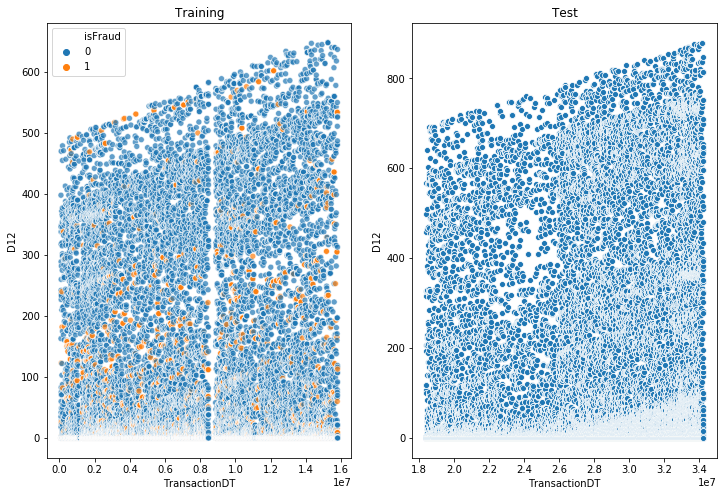

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="D12",hue="isFraud",data=train_df,alpha=0.7,hue_order=[0,1])
plt.title('Training')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="D12",data=test_df[~test_df['D12'].isnull()])
plt.title('Test')

In [ ]:
#Analyzing D13 attribute
d13 = describe(train_df,test_df,'D13')
d13

,D13,Training,Fraudulent,Non-fraudulent,Test
0,count,61237,6747,54490,123384
1,mean,inf,6.51562,inf,NaN
2,std,inf,inf,inf,NaN
3,min,0,0,0,0
4,25%,0,0,0,0
5,50%,0,0,0,0
6,75%,0,0,0,0
7,max,847,745,847,1066
8,unique,577,128,577,806
9,NaN,528463,13818,514645,383307


Text(0.5, 1.0, 'Test')

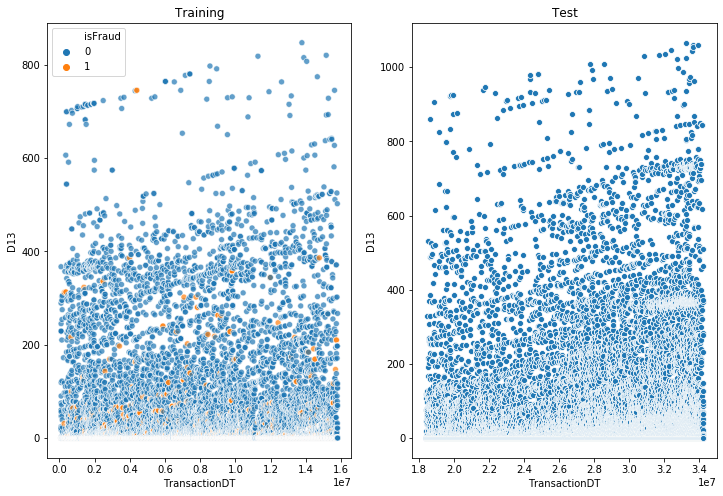

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="D13",hue="isFraud",data=train_df,alpha=0.7,hue_order=[0,1])
plt.title('Training')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="D13",data=test_df[~test_df['D13'].isnull()])
plt.title('Test')

In [ ]:
#Analyzing D14 attribute
d14 = describe(train_df,test_df,'D14')
d14

,D14,Training,Fraudulent,Non-fraudulent,Test
0,count,61567,7130,54437,115194
1,mean,inf,inf,inf,NaN
2,std,inf,inf,inf,NaN
3,min,-193,0,-193,0
4,25%,0,0,0,0
5,50%,0,0,0,0
6,75%,2,9,1,0
7,max,878,847,878,1085
8,unique,802,379,800,1032
9,NaN,528133,13435,514698,391497


Text(0.5, 1.0, 'Test')

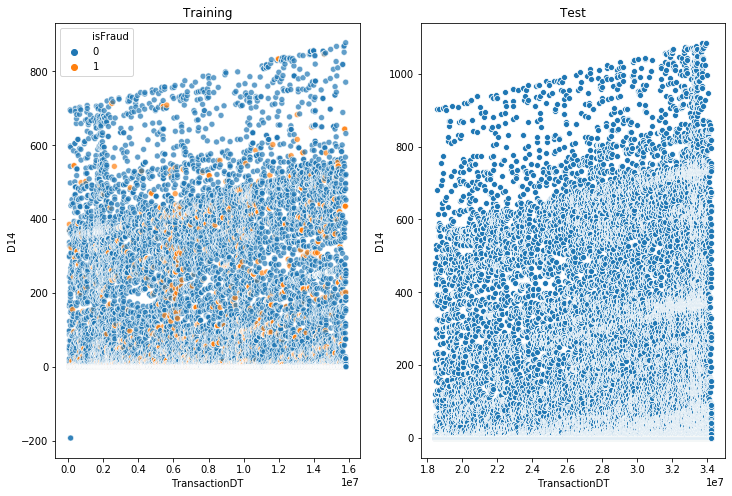

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="D14",hue="isFraud",data=train_df,alpha=0.7,hue_order=[0,1])
plt.title('Training')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="D14",data=test_df[~test_df['D14'].isnull()])
plt.title('Test')

In [ ]:
#removig -ve values
train_df[train_df['D14']<0].index

Int64Index([4085, 4097], dtype='int64')

In [ ]:
train_df.drop([4085,4097],inplace=True)

In [ ]:
#Analyzing D15 attribute
d15 = describe(train_df,test_df,'D15')
d15

,D15,Training,Fraudulent,Non-fraudulent,Test
0,count,500593,16289,484304,494622
1,mean,NaN,inf,NaN,NaN
2,std,NaN,inf,NaN,NaN
3,min,-60,0,-60,0
4,25%,0,0,0,0
5,50%,52,1,57,48
6,75%,315,63,322,370
7,max,879,835,879,1091
8,unique,851,642,851,1079
9,NaN,89105,4276,84829,12069


Text(0.5, 1.0, 'Test')

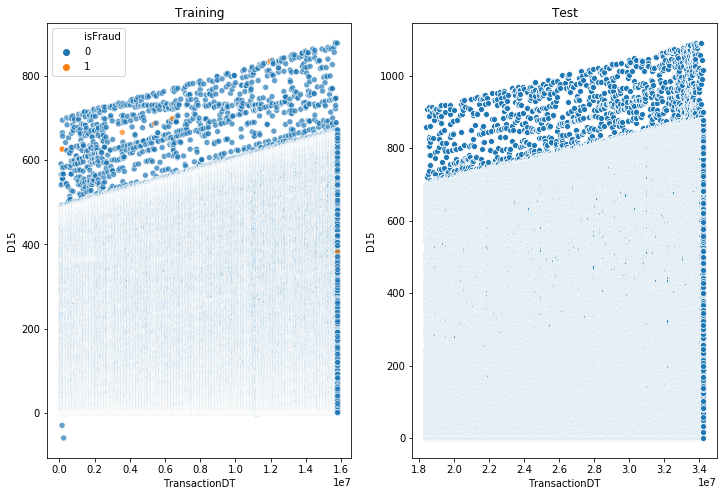

In [ ]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="D15",hue="isFraud",data=train_df,alpha=0.7,hue_order=[0,1])
plt.title('Training')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="D15",data=test_df[~test_df['D15'].isnull()])
plt.title('Test')

In [ ]:
#removig -ve values
train_df[train_df['D15']<0].index

Int64Index([3034, 7589, 13149, 442444, 442467], dtype='int64')

In [ ]:
train_df.drop([3034, 7589, 13149, 442444, 442467],inplace=True)

In [ ]:
#-ve values removed coz it is refering to timedelta and it can't be negative

In [ ]:
#Finding Correlation between d_attributes
d_cor = train_df[['D1','D2','D3','D4','D5','D6','D7','D8','D9','D10','D11','D12','D13','D14','D15','isFraud']]

In [ ]:
value=d_cor.corr()

Text(0.5, 1, 'D_training')

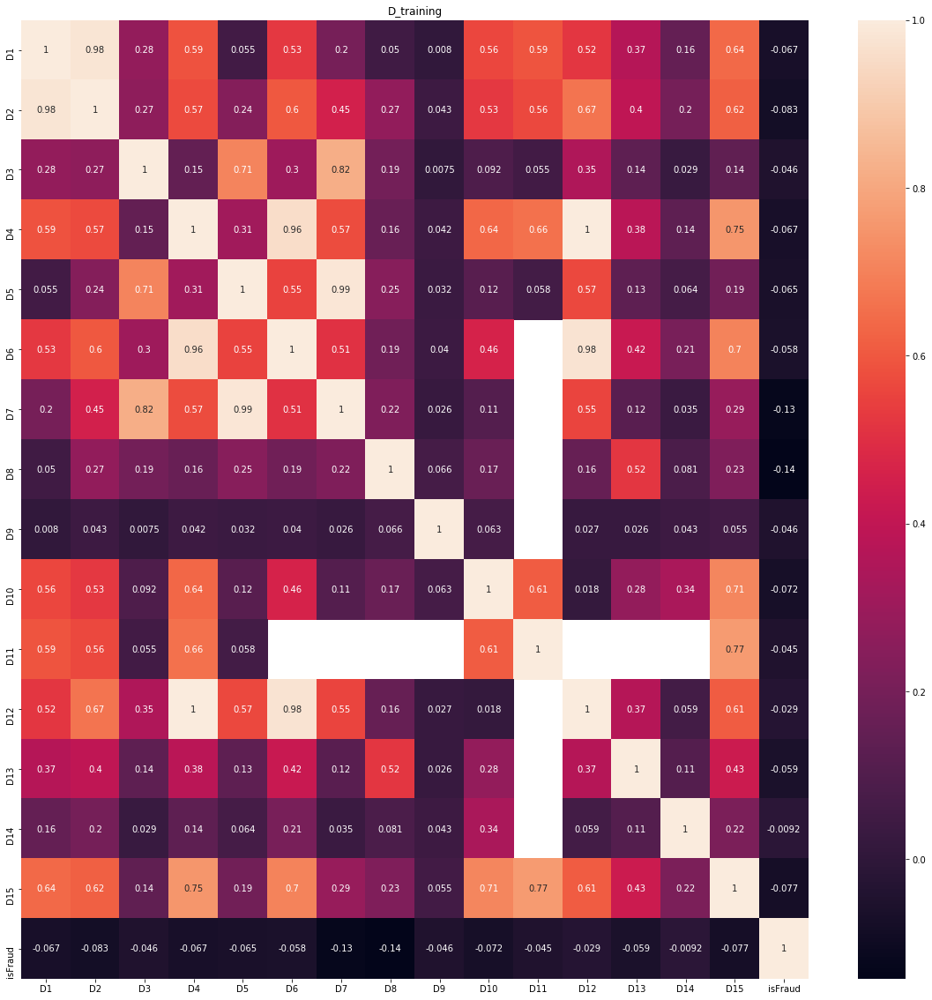

In [ ]:
plt.figure(1,figsize=(20,20))
sns.heatmap(value,annot=True)
plt.title('D_training')

In [ ]:
#Finding Correlation between d_attributes in test data
d_cor_test = test_df[['D1','D2','D3','D4','D5','D6','D7','D8','D9','D10','D11','D12','D13','D14','D15']]

In [ ]:
value=d_cor_test.corr()

Text(0.5, 1, 'D_training')

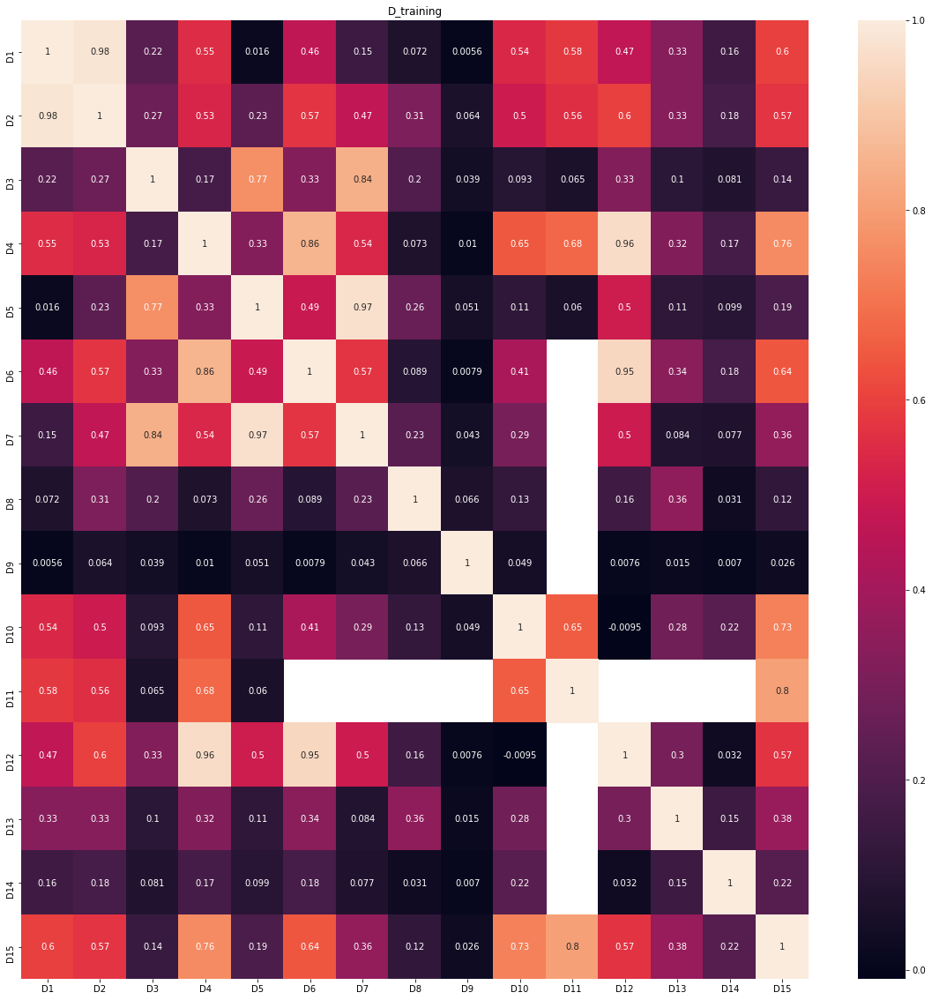

In [ ]:
plt.figure(1,figsize=(20,20))
sns.heatmap(value,annot=True)
plt.title('D_training')

In [ ]:
#higly correlated D4 and D12, 'D6 and D12', and 'D5 and D7'

In [ ]:
#Analyzing M1 to M9 attribute
for i in ['M1','M2','M3','M4','M5','M6','M7','M8','M9']:
    print(train_df[(~train_df[i].isnull())&(train_df['isFraud']==0)][i].value_counts())
    print(train_df[(~train_df[i].isnull())&(train_df['isFraud']==1)][i].value_counts())
    print('-----------------------------------------------------------------')


T    313051
F        25
Name: M1, dtype: int64
T    6342
Name: M1, dtype: int64
-----------------------------------------------------------------
T    280289
F     32787
Name: M2, dtype: int64
T    5158
F    1184
Name: M2, dtype: int64
-----------------------------------------------------------------
T    247421
F     65655
Name: M3, dtype: int64
T    4293
F    2049
Name: M3, dtype: int64
-----------------------------------------------------------------
M0    189104
M2     52422
M1     51397
Name: M4, dtype: int64
M0    7181
M2    6728
M1    1429
Name: M4, dtype: int64
-----------------------------------------------------------------
F    128968
T    103508
Name: M5, dtype: int64
T    4055
F    3514
Name: M5, dtype: int64
-----------------------------------------------------------------
F    222450
T    190018
Name: M6, dtype: int64
F    5397
T    3295
Name: M6, dtype: int64
-----------------------------------------------------------------
F    207269
T     32171
Name: M7, dtype: int64

Text(0.5, 1.0, 'TrainM9')

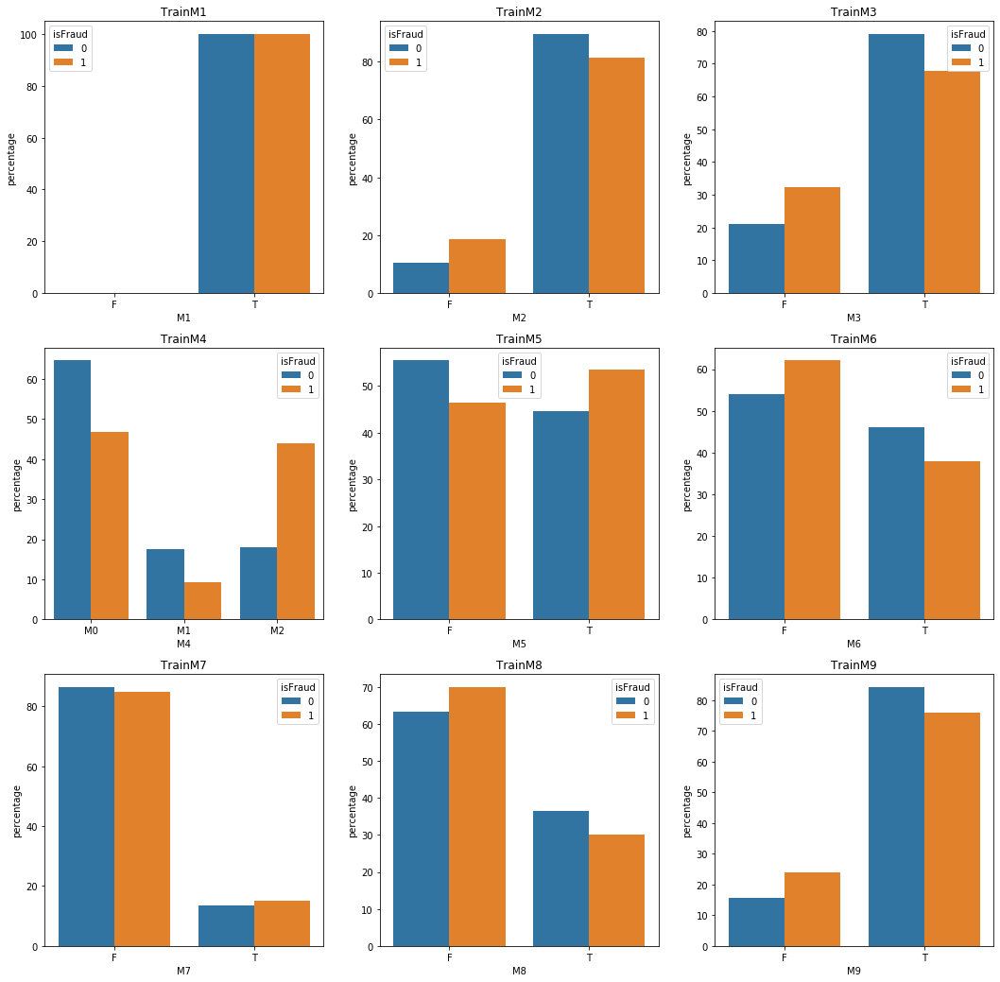

In [ ]:
plt.figure(figsize=(18,18))
plt.subplot(3,3,1)
train_m1 = (train_df.groupby(['isFraud'])['M1']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('M1'))
sns.barplot(x="M1", y="percentage", hue="isFraud", data=train_m1)
plt.title('TrainM1')
plt.subplot(3,3,2)
train_m2 = (train_df.groupby(['isFraud'])['M2']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('M2'))
sns.barplot(x="M2", y="percentage", hue="isFraud", data=train_m2)
plt.title('TrainM2')
plt.subplot(3,3,3)
train_m3 = (train_df.groupby(['isFraud'])['M3']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('M3'))
sns.barplot(x="M3", y="percentage", hue="isFraud", data=train_m3)
plt.title('TrainM3')
plt.subplot(3,3,4)
train_m4 = (train_df.groupby(['isFraud'])['M4']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('M4'))
sns.barplot(x="M4", y="percentage", hue="isFraud", data=train_m4)
plt.title('TrainM4')
plt.subplot(3,3,5)
train_m5 = (train_df.groupby(['isFraud'])['M5']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('M5'))
sns.barplot(x="M5", y="percentage", hue="isFraud", data=train_m5)
plt.title('TrainM5')
plt.subplot(3,3,6)
train_m6 = (train_df.groupby(['isFraud'])['M6']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('M6'))
sns.barplot(x="M6", y="percentage", hue="isFraud", data=train_m6)
plt.title('TrainM6')
plt.subplot(3,3,7)
train_m7 = (train_df.groupby(['isFraud'])['M7']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('M7'))
sns.barplot(x="M7", y="percentage", hue="isFraud", data=train_m7)
plt.title('TrainM7')
plt.subplot(3,3,8)
train_m8 = (train_df.groupby(['isFraud'])['M8']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('M8'))
sns.barplot(x="M8", y="percentage", hue="isFraud", data=train_m8)
plt.title('TrainM8')
plt.subplot(3,3,9)
train_m9 = (train_df.groupby(['isFraud'])['M9']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('M9'))
sns.barplot(x="M9", y="percentage", hue="isFraud", data=train_m9)
plt.title('TrainM9')

In [ ]:
#No particular deductions from above

In [ ]:
#Analyzing V attributes
#V features are masked and have NaN value
#Not possible to visualize them individually


In [ ]:
#Analysis on DeviceInfo
train_df['DeviceInfo'].value_counts()

Windows                           47491
iOS Device                        19559
MacOS                             12471
Trident/7.0                        7415
rv:11.0                            1894
rv:57.0                             954
SM-J700M Build/MMB29K               547
SM-G610M Build/MMB29K               458
SM-G531H Build/LMY48B               410
rv:59.0                             362
SM-G935F Build/NRD90M               331
SM-G955U Build/NRD90M               326
SM-G532M Build/MMB29T               314
ALE-L23 Build/HuaweiALE-L23         311
SM-G950U Build/NRD90M               286
SM-G930V Build/NRD90M               272
rv:58.0                             269
rv:52.0                             254
SAMSUNG                             234
SM-G950F Build/NRD90M               225
Moto G (4) Build/NPJ25.93-14.7      219
SM-N950U Build/NMF26X               205
SM-A300H Build/LRX22G               202
hi6210sft Build/MRA58K              190
SM-J730GM Build/NRD90M              184


In [ ]:
#Grouping similar types of model together

def group_DeviceInfo(di):
    di['DeviceName'] = di['DeviceInfo']
    di.loc[di['DeviceInfo'].str.contains('HUAWEI|HONOR', case=False, na=False, regex=True), 'DeviceName'] = 'HUAWEI'
    di.loc[di['DeviceInfo'].str.contains('OS', na=False, regex=False), 'DeviceName'] = 'APPLE'
    di.loc[di['DeviceInfo'].str.contains('Idea|TA', case=False, na=False), 'DeviceName'] = 'Lenovo'
    di.loc[di['DeviceInfo'].str.contains('Moto|XT|Edison', case=False, na=False), 'DeviceName'] = 'Moto'
    di.loc[di['DeviceInfo'].str.contains('MI|Mi|Redmi', na=False), 'DeviceName'] = 'Mi'
    di.loc[di['DeviceInfo'].str.contains('VS|LG|EGO', na=False), 'DeviceName'] = 'LG'
    di.loc[di['DeviceInfo'].str.contains('ONE TOUCH|ALCATEL', case=False, na=False, regex=False), 'DeviceName'] = 'ALCATEL'
    di.loc[di['DeviceInfo'].str.contains('ONE A', na=False, regex=False), 'DeviceName'] = 'ONEPLUS'
    di.loc[di['DeviceInfo'].str.contains('OPR6', na=False, regex=False), 'DeviceName'] = 'HTC'
    di.loc[di['DeviceInfo'].str.contains('Nexus|Pixel', case=False, na=False, regex=True), 'DeviceName'] = 'google'
    di.loc[di['DeviceInfo'].str.contains('STV', na=False, regex=False), 'DeviceName'] = 'blackberry'
    di.loc[di['DeviceInfo'].str.contains('ASUS', case=False, na=False, regex=False), 'DeviceName'] = 'ASUS'
    di.loc[di['DeviceInfo'].str.contains('BLADE', case=False, na=False, regex=False), 'DeviceName'] = 'ZTE'
    
    di['DeviceName'] = di['DeviceInfo'].astype('str').str.split(':', expand=True)[0].\
                                str.split('-', expand=True)[0].str.split(expand=True)[0]
    
    di.loc[di['DeviceInfo'].isin(['rv', 'SM', 'GT', 'SGH']), 'DeviceName'] = 'SAMSUNG'
    di.loc[di['DeviceInfo'].str.startswith('Z', na=False), 'DeviceName'] = 'ZTE'
    di.loc[di['DeviceInfo'].str.startswith('KF', na=False), 'DeviceName'] = 'Amazon'
    
    for i in ['D', 'E', 'F', 'G']:
        di.loc[di['DeviceInfo'].str.startswith(i, na=False), 'DeviceName'] = 'SONY'

    di.loc[di['DeviceName'].isin(di['DeviceName'].value_counts()\
                                 [di['DeviceName'].value_counts() < 100].index), 'DeviceName'] = 'Others'
    di['DeviceName'] = di['DeviceName'].str.upper()
    
    return di

In [ ]:
train_df = group_DeviceInfo(train_df)
test_df = group_DeviceInfo(test_df)

In [ ]:
def setNaNvalue(value):
    if value=='NAN':
        return np.nan
    else:
        return value

In [ ]:
train_df['DeviceName'] = train_df['DeviceName'].apply(setNaNvalue)
test_df['DeviceName'] = test_df['DeviceName'].apply(setNaNvalue)

Text(0.5, 1.0, 'Test_DeviceType')

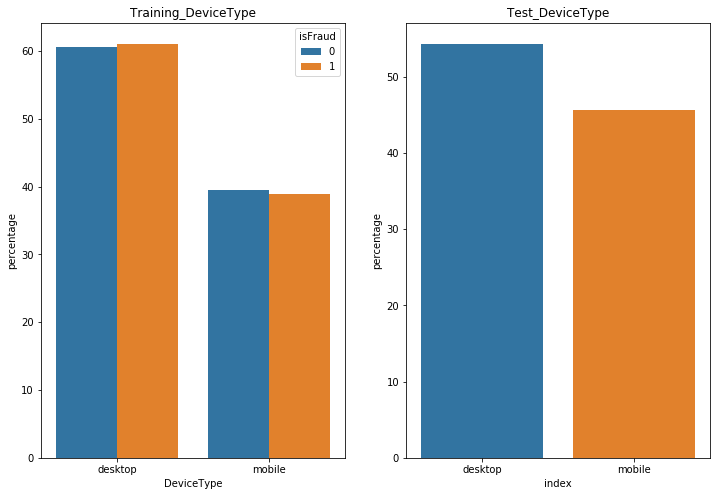

In [ ]:
#Analysis on DeviceType attribute
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
train_type = (train_df.groupby(['isFraud'])['DeviceType']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('DeviceType'))
sns.barplot(x="DeviceType", y="percentage", hue="isFraud", data=train_type)
plt.title('Training_DeviceType')
plt.subplot(1,2,2)
Test_type =test_df[~test_df['DeviceType'].isnull()]['DeviceType'].value_counts(normalize=True).mul(100).rename('percentage')\
.reset_index()
sns.barplot(x="index", y="percentage", data=Test_type)
plt.title('Test_DeviceType')

In [ ]:
#same no of fradulent and non-fraudulent transactions

In [ ]:
#Analysis on 'id30' attribute
train_df['id_30'].value_counts()

Windows 10          21057
Windows 7           13048
iOS 11.1.2           3645
iOS 11.2.1           3634
Android 7.0          2839
Mac OS X 10_12_6     2536
Mac OS X 10_11_6     2327
iOS 11.3.0           2016
Windows 8.1          1905
iOS 11.2.6           1647
Mac OS X 10_10_5     1632
iOS 10.3.3           1545
Mac OS X 10_13_2     1409
Mac OS X 10_13_1     1202
iOS 11.2.5           1198
Linux                1126
Android              1074
iOS 11.2.2            902
Mac OS X 10_13_3      860
iOS 11.2.0            840
Mac OS X 10_13_4      759
iOS 11.1.1            690
iOS 11.0.3            646
Android 7.1.1         622
Mac OS X 10_9_5       564
Android 6.0.1         561
iOS 10.3.2            423
iOS 9.3.5             410
Android 5.1.1         349
Android 8.0.0         343
                    ...  
iOS 11.3.1            136
Mac OS X 10.10        135
Windows XP            130
iOS 11.0.1            127
Mac OS X 10_12_4      103
iOS 10.1.1             96
Mac OS X 10_12_3       95
iOS 10.0.2  

In [ ]:
test_df['id_30'].value_counts()

Windows 10          21015
Windows 7           10368
iOS 12.1.0           6349
iOS 11.4.1           3538
Mac OS X 10_13_6     3254
Android 8.0.0        2455
iOS 12.0.1           1691
iOS 11.4.0           1605
Mac OS X 10_11_6     1454
Windows 8.1          1394
Linux                1352
Mac OS X 10_12_6     1325
iOS 12.0.0           1255
iOS 12.1.2           1208
Mac OS X 10_14_1     1063
Mac OS X 10_10_5      924
Android               769
Android 7.0           702
iOS 11.3.0            646
Mac OS X 10_14_2      622
iOS 12.1.1            539
iOS 10.3.3            485
Mac OS X 10_13_5      430
Mac OS X 10_13_4      392
Android 8.1.0         381
Mac OS X 10_14        360
Android 5.1.1         327
Mac OS X 10.13        327
Mac OS X 10_14_0      305
Mac OS X 10_9_5       264
                    ...  
iOS 11.0.3             52
Mac OS X 10_7_5        45
Mac OS X 10.9          38
iOS 11.1.0             34
iOS 10.2.0             33
Mac OS X 10_8_5        32
Mac OS X 10_12_4       32
Android 5.0.

In [ ]:
#contain OS and version, can split them
def split_id30(df):
    df['OS_id_30'] = df['id_30'].str.split(' ', expand=True)[0]
    df['version_id_30'] = df['id_30'].str.split(' ', expand=True)[1]

In [ ]:
split_id30(train_df)
split_id30(test_df)

In [ ]:
#Analysis on 'id31' attribute
train_df['id_31'].value_counts()

chrome 63.0                   21778
mobile safari 11.0            13239
mobile safari generic         11451
ie 11.0 for desktop            8998
safari generic                 8136
chrome 62.0                    7155
chrome 65.0                    6871
chrome 64.0                    6711
chrome 63.0 for android        5718
chrome generic                 4770
chrome 66.0                    4264
edge 16.0                      4174
chrome 64.0 for android        3473
chrome 65.0 for android        3336
firefox 57.0                   3287
mobile safari 10.0             2739
chrome 66.0 for android        2349
chrome 62.0 for android        2090
edge 15.0                      1589
chrome generic for android     1158
firefox 59.0                   1099
samsung browser 6.2            1052
firefox 58.0                    833
chrome 49.0                     715
firefox                         669
ie 11.0 for tablet              644
chrome 61.0                     632
safari 11.0                 

In [ ]:
#Analysis on 'id31' attribute
test_df['id_31'].value_counts()

chrome 70.0                       16054
mobile safari 12.0                13098
mobile safari 11.0                10232
chrome 71.0                        9489
chrome 69.0                        8293
chrome 70.0 for android            7624
chrome 68.0                        6449
chrome 67.0                        6122
chrome 69.0 for android            6022
ie 11.0 for desktop                5173
chrome 71.0 for android            5029
edge 17.0                          4871
chrome 67.0 for android            3636
safari 12.0                        3550
chrome 68.0 for android            3520
safari 11.0                        2897
firefox 63.0                       1899
samsung browser 7.4                1369
firefox 61.0                       1321
firefox 64.0                       1251
mobile safari 10.0                 1154
firefox 62.0                       1107
safari 10.0                         947
ie 11.0 for tablet                  683
chrome 70.0 for ios                 665


In [ ]:
#contain version of browser, can split them
def split_id31(df):
    df['browser_id_31'] = df['id_31'].str.split(' ', expand=True)[0]
    df['version_id_31'] = df['id_31'].str.split(' ', expand=True)[1]

In [ ]:
split_id31(train_df)
split_id31(test_df)

In [ ]:
#Analysis on 'id33' attribute
train_df['id_33'].value_counts()

1920x1080    16780
1366x768      8564
1334x750      6361
2208x1242     4831
1440x900      4344
1600x900      3498
2048x1536     3456
1280x800      2131
2560x1600     2069
2560x1440     1854
2880x1800     1741
1280x1024     1735
1680x1050     1721
1136x640      1693
2436x1125     1471
1280x720      1312
1920x1200     1050
2001x1125     1012
1024x768       820
2220x1080      540
5120x2880      397
3360x2100      378
2732x2048      353
1366x767       335
3840x2160      260
855x480        249
2736x1824      239
1360x768       223
4096x2304      208
2224x1668      194
             ...  
480x320          1
2159x1439        1
1536x1152        1
1120x700         1
4499x2999        1
1920x1279        1
1536x960         1
1280x740         1
1596x710         1
1638x922         1
2048x1278        1
1700x960         1
2010x1080        1
2100x1312        1
1441x901         1
3072x1728        1
3840x2162        1
3838x2160        1
1280x732         1
1422x889         1
2048x1080        1
2160x1081   

In [ ]:
test_df['id_33'].value_counts()

1920x1080    16868
1366x768      6441
1334x750      5103
2208x1242     4213
1440x900      3743
1600x900      3093
2048x1536     3074
2436x1125     2746
2880x1800     1888
2560x1600     1778
1280x800      1555
2560x1440     1460
1680x1050     1449
1280x1024     1328
1024x768      1227
1136x640      1113
1280x720      1089
2220x1080      886
2220x1081      885
2001x1125      855
1920x1200      836
1366x767       501
3360x2100      490
2688x1242      469
5120x2880      469
2732x2048      437
2224x1668      357
2736x1824      326
3840x2160      325
1919x1080      264
             ...  
1272x952         1
800x480          1
2341x1080        1
1408x792         1
2399x1598        1
2401x1351        1
2052x1368        1
1920x1128        1
1920x1017        1
1366x766         1
1912x1025        1
1368x912         1
1500x840         1
1599x1200        1
2556x1248        1
3784x1584        1
2112x1320        1
1280x740         1
1669x942         1
1280x799         1
1600x1280        1
1920x983    

In [ ]:
#contain width and height of screen
def split_id33(df):
    df['width'] = df['id_33'].str.split('x', expand=True)[0]
    df['height'] = df['id_33'].str.split('x', expand=True)[1]

In [ ]:
split_id33(train_df)
split_id33(test_df)

In [ ]:
#Drop features which have large amount of irrevelant data